<a href="https://colab.research.google.com/github/NithishaRaghavaraju/ML_with_TDA/blob/main/MLwithTDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install gudhi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 22.9 MB/s eta 0:00:00


In [ ]:
!pip install numpy==1.23.5 gensim==4.3.1 tensorflow==2.12.0 scipy==1.10.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 581.3 kB/s eta 0:00:00
INFO: pip is looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of jax to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 37.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 586.0/586.0 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.1/34.1 MB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 44.6 MB/s eta 0:00:00
   

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt


from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import TfidfVectorizer

from gensim.models import Word2Vec
from gensim.models import FastText
import gensim

import torch
import re
import random

import tensorflow
from tensorflow.keras.preprocessing.text import Tokenizer
from transformers import BertTokenizer, BertModel
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Embedding, LSTM, LayerNormalization, Dense, Dropout
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

import nltk
from nltk.tokenize import word_tokenize


import gudhi
from gudhi.representations import (DiagramSelector, Clamping, Landscape, Silhouette, BettiCurve, ComplexPolynomial,\
  TopologicalVector, DiagramScaler, BirthPersistenceTransform,\
  PersistenceImage, PersistenceWeightedGaussianKernel, Entropy, \
  PersistenceScaleSpaceKernel, SlicedWassersteinDistance,\
  SlicedWassersteinKernel, PersistenceFisherKernel, WassersteinDistance)


# Without TDA

In [ ]:

with open('intents.json', 'r') as f:
    data = json.load(f)

df = pd.DataFrame(data['intents'])

dic = {"tag":[], "patterns":[], "responses":[]}
for i in range(len(df)):
    ptrns = df[df.index == i]['patterns'].values[0]
    rspns = df[df.index == i]['responses'].values[0]
    tag = df[df.index == i]['tag'].values[0]
    for j in range(len(ptrns)):
        dic['tag'].append(tag)
        dic['patterns'].append(ptrns[j])
        dic['responses'].append(rspns)

df = pd.DataFrame.from_dict(dic)
df = df.drop(index=29)
df

tokenizer = Tokenizer(lower=True, split=' ')
tokenizer.fit_on_texts(df['patterns'])
tokenizer.get_config()


vacab_size = len(tokenizer.word_index)
print('number of unique words = ', vacab_size)

ptrn2seq = tokenizer.texts_to_sequences(df['patterns'])
X = pad_sequences(ptrn2seq, padding='post')
print('X shape = ', X.shape)

lbl_enc = LabelEncoder()
y = lbl_enc.fit_transform(df['tag'])
print('y shape = ', y.shape)
print('num of classes = ', len(np.unique(y)))


# Defining a sequential neural network model
max_sequence_length = X.shape[1]
model = Sequential([
    Input(shape=(max_sequence_length,)),  # Input layer with shape 300 (concatenated feature size)

    Dense(128, activation="relu"),  # First dense layer with ReLU activation
    LayerNormalization(),  # Normalize activations to stabilize training
    Dropout(0.2),  # Dropout to prevent overfitting

    Dense(128, activation="relu"),  # Second dense layer with ReLU activation
    LayerNormalization(),  # Normalize activations
    Dropout(0.2),  # Dropout to prevent overfitting

    Dense(len(np.unique(y)), activation="softmax"),  # Output layer with softmax activation for classification
])

# Compile the model with Adam optimizer and sparse categorical cross-entropy loss
model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])

# Print the model summary to check architecture
model.summary()

# Train the model
model_history = model.fit(
    x=X,  # Training data (concatenated features)
    y=y,  # Target labels
    batch_size=10,  # Batch size for training
    callbacks=[tensorflow.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)],  # Early stopping to prevent overfitting
    epochs=50  # Maximum number of training epochs
)



number of unique words =  303
X shape =  (231, 18)
y shape =  (231,)
num of classes =  79
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 128)               2432      
                                                                 
 layer_normalization_10 (Lay  (None, 128)              256       
 erNormalization)                                                
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_16 (Dense)            (None, 128)               16512     
                                                                 
 layer_normalization_11 (Lay  (None, 128)              256       
 erNormalization)                                                
                              

# With Tda

## Reading the data

In [ ]:

# Load the intents JSON file which contains the training data
with open('intents.json', 'r') as f:
    data = json.load(f)

# Convert the 'intents' key from the JSON into a pandas DataFrame
df = pd.DataFrame(data['intents'])

# Create a new dictionary to flatten the patterns and responses for each tag
dic = {"tag":[], "patterns":[], "responses":[]}

# Loop through each intent in the DataFrame
for i in range(len(df)):
    # Extract the list of patterns and responses for the current intent
    ptrns = df[df.index == i]['patterns'].values[0]
    rspns = df[df.index == i]['responses'].values[0]
    # Extract the tag associated with the current intent
    tag = df[df.index == i]['tag'].values[0]

    # Loop through each pattern for the current tag
    for j in range(len(ptrns)):
        dic['tag'].append(tag)              # Append the tag
        dic['patterns'].append(ptrns[j])    # Append each pattern
        dic['responses'].append(rspns)      # Append the full list of responses

# Convert the dictionary into a new flattened DataFrame
df = pd.DataFrame.from_dict(dic)
df = df.drop(index=29) # removing null item


# Initialize the Keras tokenizer
# 'lower=True' makes all text lowercase
# 'split=" "' specifies that tokens are split by spaces
tokenizer = Tokenizer(lower=True, split=' ')

# Fit the tokenizer on the patterns (i.e., input sentences)
tokenizer.fit_on_texts(df['patterns'])

# Get the size of the vocabulary (i.e., number of unique words found in the patterns)
vocab_size = len(tokenizer.word_index)
print('number of unique words = ', vocab_size)
lbl_enc = LabelEncoder()
Y = lbl_enc.fit_transform(df['tag']) # target label
Y = np.array(Y)


number of unique words =  303


## Encoding the data

### One hot Encoder

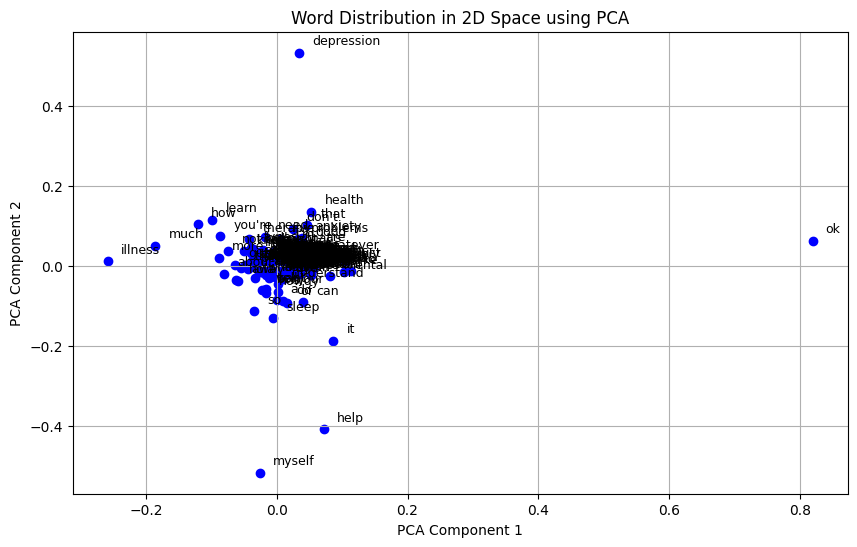

In [ ]:
# Create one-hot encoded vectors using an identity matrix
# This means each word is represented by a unique vector with 1 in one position and 0 elsewhere
word_vectors = np.eye(vocab_size)

# Apply PCA (Principal Component Analysis) to reduce the dimensionality of the word vectors
# We reduce it to 2 dimensions so we can visualize it in a 2D plot
pca = PCA(n_components=2)
reduced_vectors = pca.fit_transform(word_vectors)

# Start creating the plot
plt.figure(figsize=(10, 6))  # Set the size of the plot

# Plot each word in the 2D space
for word, i in tokenizer.word_index.items():  # word_index maps each word to its index
    x, y = reduced_vectors[i-1]  # Get the x and y coordinates for the word
                                 # Subtract 1 because indices in reduced_vectors start from 0
    plt.scatter(x, y, marker='o', color='blue')  # Plot a blue dot for the word
    plt.text(x + 0.02, y + 0.02, word, fontsize=9)  # Add the word next to the dot for identification

# Add labels and a title to the plot
plt.xlabel('PCA Component 1')  # Label for x-axis
plt.ylabel('PCA Component 2')  # Label for y-axis
plt.title('Word Distribution in 2D Space using PCA')  # Title of the plot
plt.grid()  # Add a grid to make the plot easier to read
plt.show()  # Display the plot


**Analysis**

The plot shows that most words are grouped close together in the center, which means they are quite similar when using one-hot encoding. Some words like "the", "a", and "is" are a bit farther away. This tells us that one-hot encoding doesn’t show real meaning or relationships between words very well.

### Word2vec

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


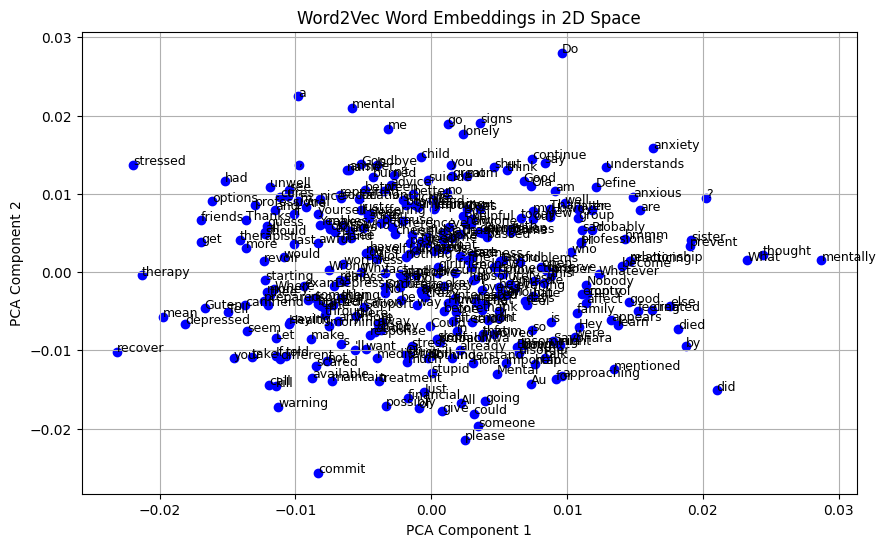

In [ ]:

nltk.download('punkt_tab')
# Tokenize the patterns into words
df['tokenized_patterns'] = df['patterns'].apply(lambda x: word_tokenize(x))

vec_size = 100
# Train a Word2Vec model
w2v_model = Word2Vec(sentences= df['tokenized_patterns'], vector_size=vec_size, window=5, min_count=1, workers=4)

# Get all word vectors from Word2Vec
word_vectors_w2v = w2v_model.wv.vectors

# Reduce dimensionality to 2D
pca_w2v = PCA(n_components=2)
reduced_w2v = pca_w2v.fit_transform(word_vectors_w2v)

# Plot the Word2Vec embeddings
plt.figure(figsize=(10, 6))
for i, word in enumerate(w2v_model.wv.index_to_key):
    plt.scatter(reduced_w2v[i, 0], reduced_w2v[i, 1], marker='o', color='blue')
    plt.text(reduced_w2v[i, 0], reduced_w2v[i, 1] , word, fontsize=9)

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Word2Vec Word Embeddings in 2D Space')
plt.grid()
plt.show()



**Analysis**
The plot shows that most words are clustered in the center, meaning they have similar representations in the Word2Vec model. However, some words like "the," "a," and "is" are slightly farther away, indicating subtle differences in their usage. Unlike one-hot encoding, which treats all words as equally different, Word2Vec captures word meanings and relationships better by placing similar words closer together in this 2D space.

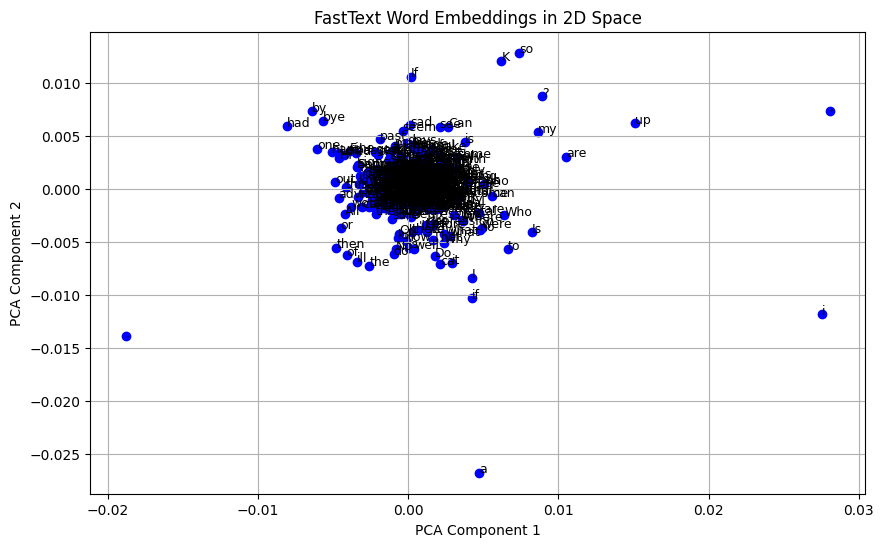

In [ ]:

# Train a FastText model
fasttext_model = FastText(sentences=df['tokenized_patterns'], vector_size=100, window=5, min_count=1, workers=4)

# Get all word vectors from FastText
word_vectors_fasttext = fasttext_model.wv.vectors
# Reduce dimensionality to 2D using PCA
pca_fasttext = PCA(n_components=2)
reduced_fasttext = pca_fasttext.fit_transform(word_vectors_fasttext)

# Plot the FastText word embeddings
plt.figure(figsize=(10, 6))
for i, word in enumerate(fasttext_model.wv.index_to_key):
    plt.scatter(reduced_fasttext[i, 0], reduced_fasttext[i, 1], marker='o', color='blue')
    plt.text(reduced_fasttext[i, 0], reduced_fasttext[i, 1], word, fontsize=9)

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('FastText Word Embeddings in 2D Space')
plt.grid()
plt.show()



**Analysis** The FastText word embedding visualization shows a dense central cluster, indicating that most words share similar representations. Unlike Word2Vec, which treats words as atomic units, FastText uses subword information, allowing it to generate embeddings for out-of-vocabulary (OOV) words. This makes it particularly effective for handling rare words, misspellings, and morphologically rich languages. In contrast, Word2Vec fails to assign embeddings to unseen words, limiting its adaptability. The presence of slightly distant words in the plot suggests subtle contextual differences, reinforcing FastText’s strength in capturing word relationships more effectively than traditional Word2Vec models.










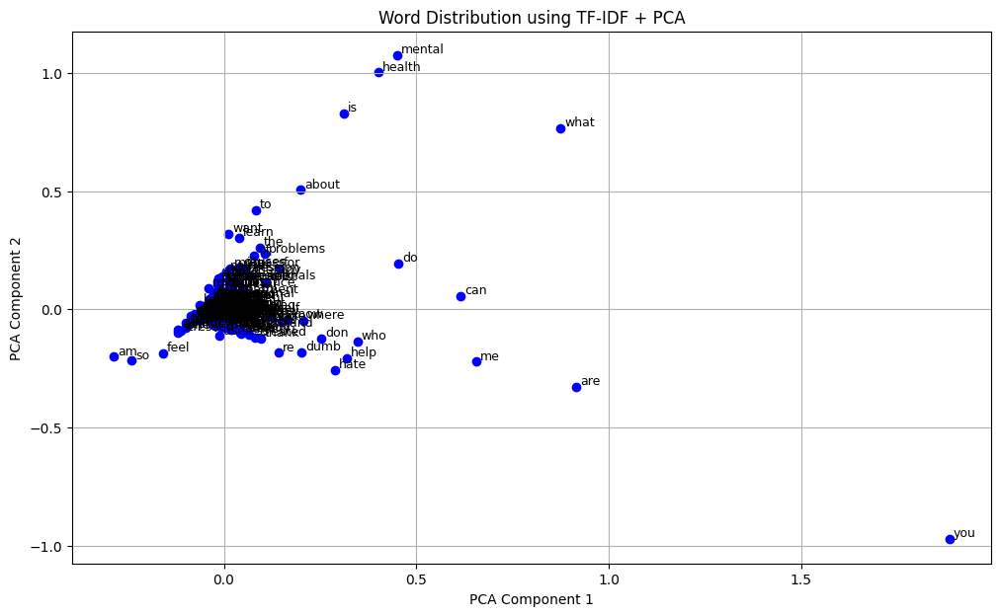

In [ ]:

# TF-IDF (Term Frequency-Inverse Document Frequency) gives more importance to rare words and less importance to common words in the dataset.
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df['patterns'])  # Convert text data into a TF-IDF matrix

# Get the list of words (features) from the TF-IDF matrix
words = vectorizer.get_feature_names_out()

# Reduce the high-dimensional word vectors into 2D using PCA (Principal Component Analysis)
pca = PCA(n_components=2) # PCA helps in visualizing the word distribution in two dimensions.
reduced_vectors = pca.fit_transform(tfidf_matrix.T.toarray())  # Transpose to get word vectors

# Plot the words in a 2D space
plt.figure(figsize=(12, 7))

# Loop through each word and plot its corresponding position
for i, word in enumerate(words):
    x, y = reduced_vectors[i]  # Get the 2D coordinates
    plt.scatter(x, y, color='blue')  # Plot each word as a blue dot
    plt.text(x + 0.01, y + 0.01, word, fontsize=9)  # Label each word near its point

# Add axis labels and title for better understanding
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Word Distribution using TF-IDF + PCA')
plt.grid()  # Add grid lines for better readability
plt.show()  # Display the plot


**Analysis**

 In contrast, the TF-IDF graph has most words tightly packed in the center, with only a few words far apart, since it focuses on word importance rather than meaning. This means Word2Vec captures semantic relationships better, while TF-IDF highlights frequently important words in the dataset.

In [ ]:
def sentence_embedding(sentence, model, vector_size=100):
    # Split the sentence into individual words
    words = sentence.split()

    # Extract word embeddings for words present in the model's vocabulary
    embeddings = [model.wv[word] for word in words if word in model.wv]

    # If the sentence has only one word, append a zero vector to avoid single-point issues
    if len(embeddings) == 1:
        embeddings.append(np.zeros(vector_size))

      # Handle case where no embeddings were found for any words in the sentence
    if not embeddings:
        print("No embeddings found for:", sentence)
        fasttext_vector = fasttext_model.wv[sentence]
        embeddings = [fasttext_model.wv[word] for word in words if word in fasttext_model.wv]

    # Apply Topological Data Analysis (TDA) using GUDHI
    rips = gudhi.RipsComplex(points=embeddings, max_edge_length=100)  # Construct Rips Complex
    simplex_tree = rips.create_simplex_tree(max_dimension=5)  # Build a simplex tree with max dimension 5
    diag = simplex_tree.persistence(homology_coeff_field=2, min_persistence=-1)  # Compute persistence diagram

    # Extract persistence diagram points
    diagram_point = [point[1] for point in diag]

    # Plot the persistence diagram
    gudhi.plot_persistence_diagram(diag)
    plt.show()


    # Return persistence diagram and mean embedding vector
    return diagram_point, np.mean(embeddings, axis=0)


/usr/local/lib/python3.11/dist-packages/gudhi/persistence_graphical_tools.py:129: UserWarning: usetex mode requires TeX.
  warnings.warn("usetex mode requires TeX.")


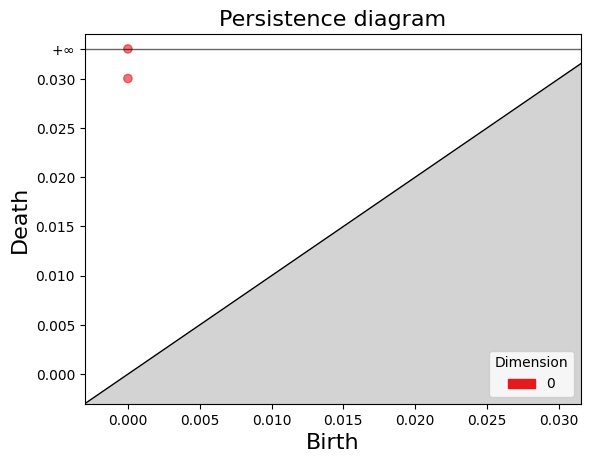

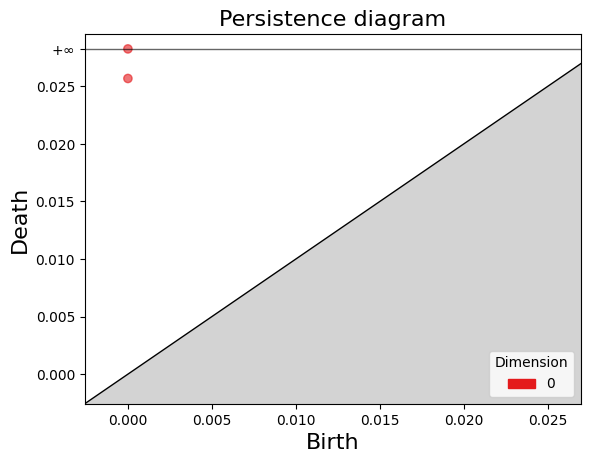

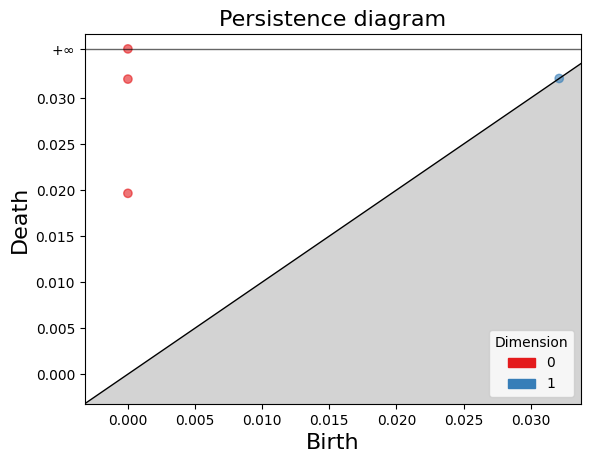

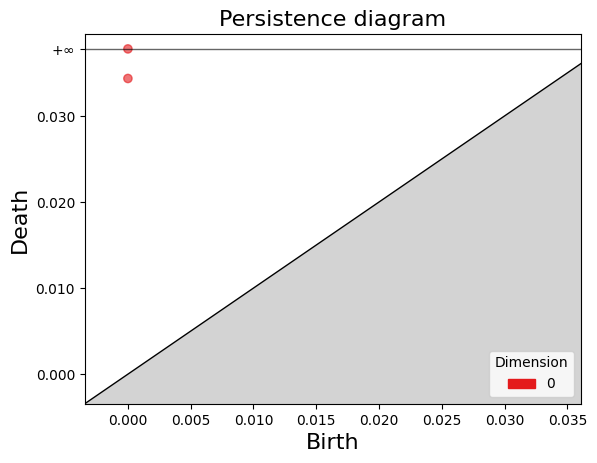

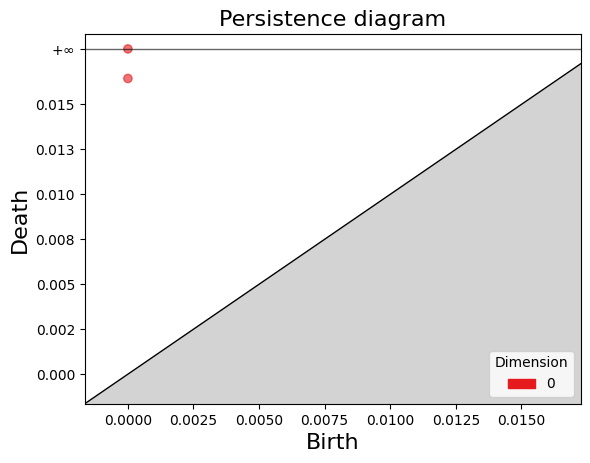

...

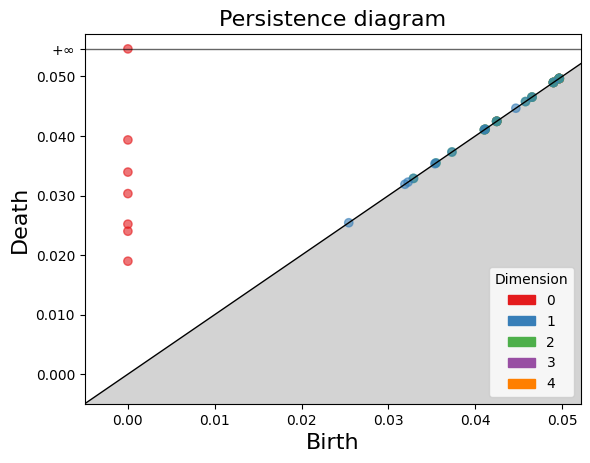

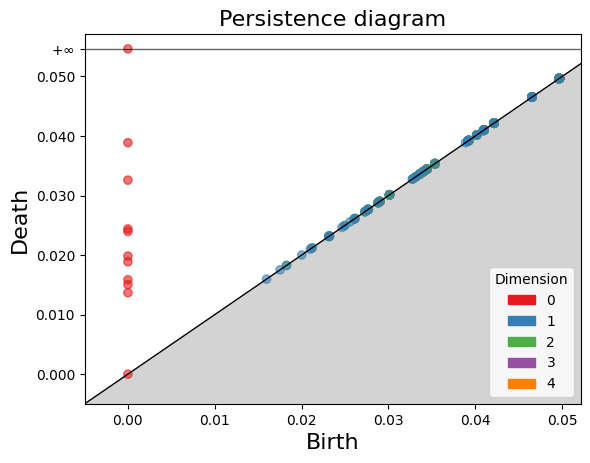

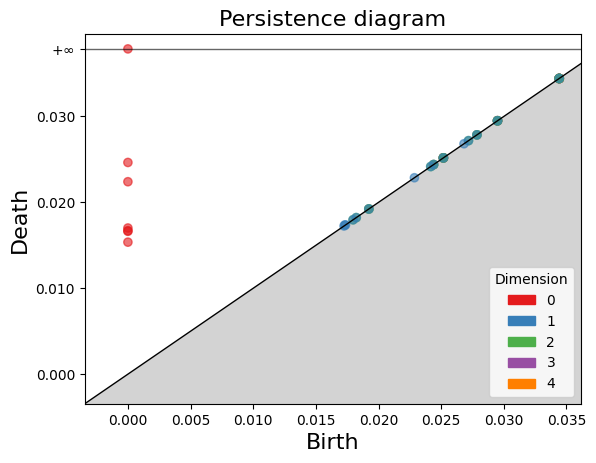

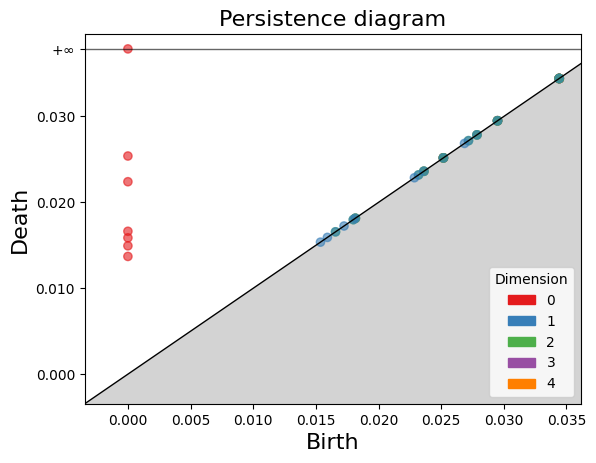

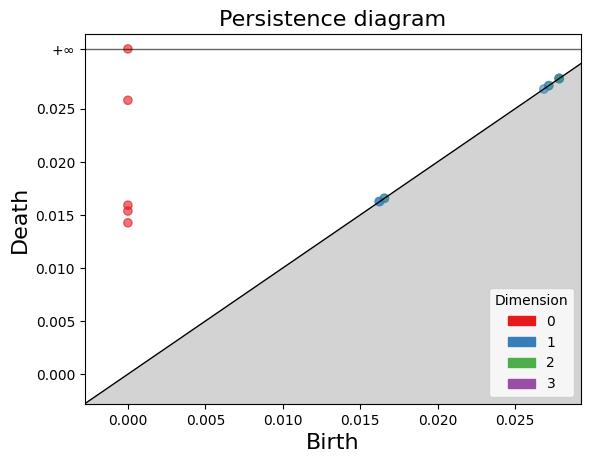

Stored 231 persistence diagrams
X shape: (231, 100)


In [ ]:
diagram_points = []  # List to store persistence diagrams
X = []  # List to store sentence embeddings

# Iterate through each sentence in the 'patterns' column of the dataframe
for sentence in df['patterns']:
    # Compute the persistence diagram and mean embedding for the sentence
    diag, mean_embedding = sentence_embedding(sentence, fasttext_model, vector_size=vec_size) # I used fasttext embedding

    # Store the persistence diagram
    diagram_points.append(diag)

    # Store the mean word embedding of the sentence
    X.append(mean_embedding)

# Convert X to a NumPy array for easier numerical processing
X = np.array(X)

# Print the number of stored persistence diagrams
print("Stored", len(diagram_points), "persistence diagrams")

# Print the shape of the NumPy array X (should be (num_sentences, vector_size))
print("X shape:", X.shape)


0


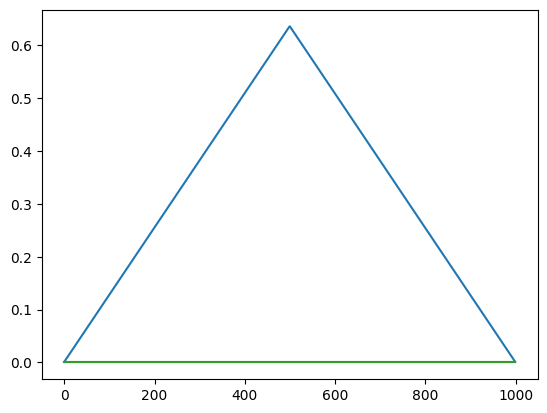

1


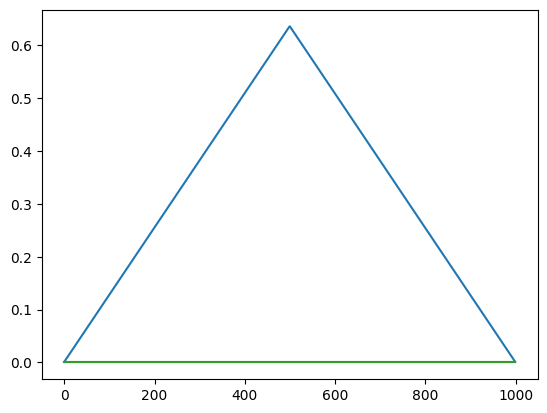

2


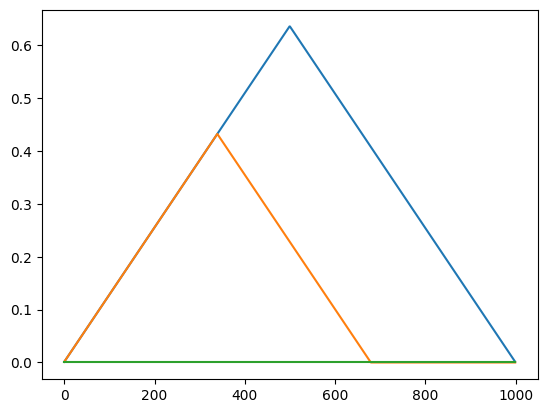

3


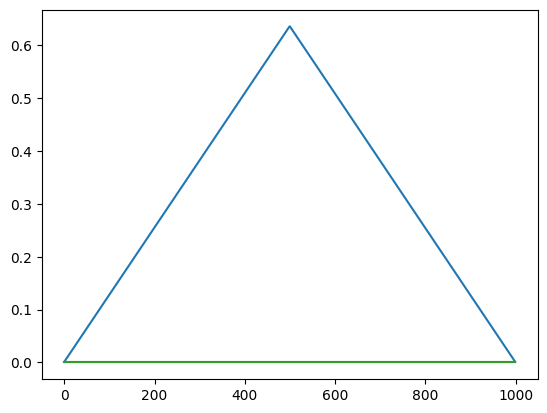

4


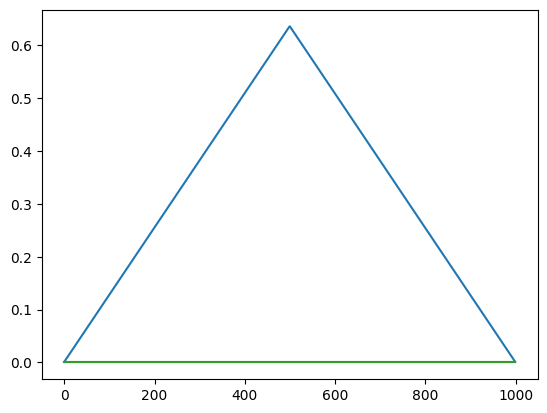

5


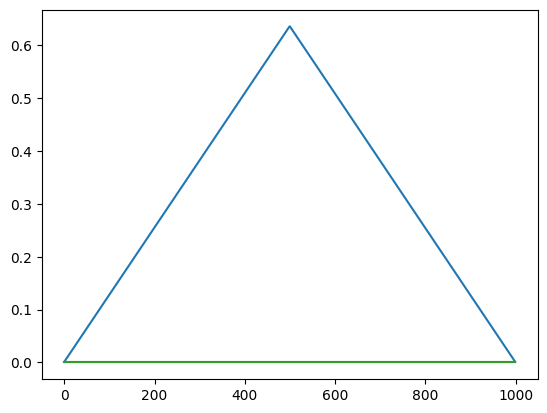

6


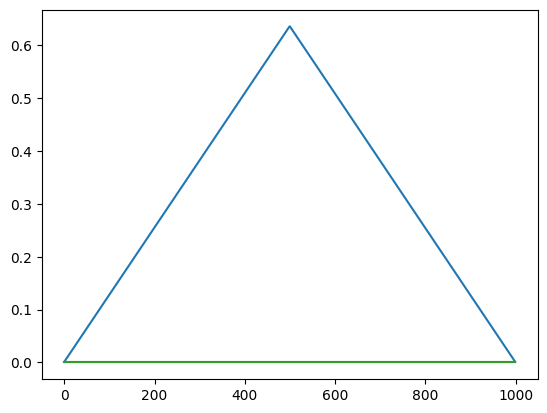

7


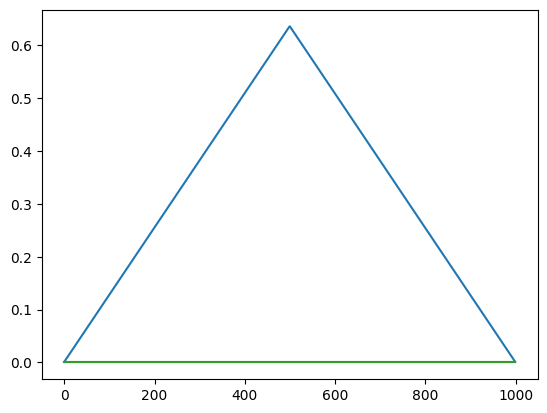

8


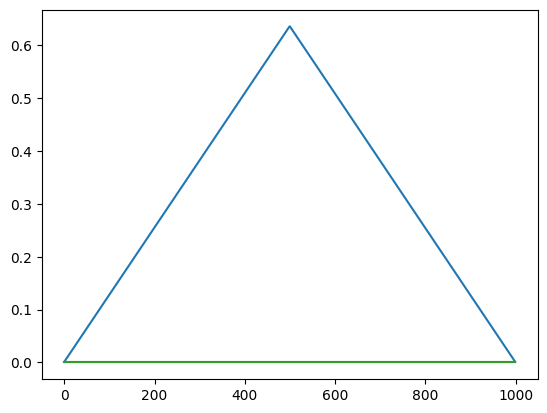

9


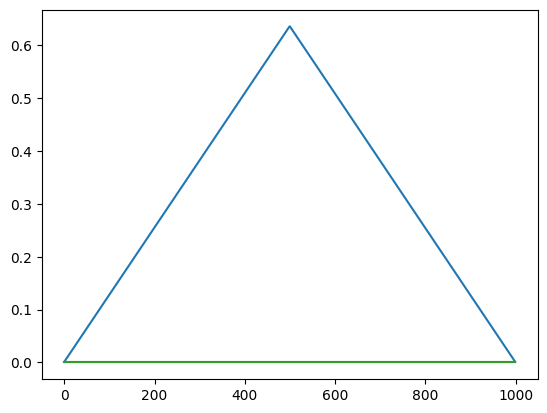

10


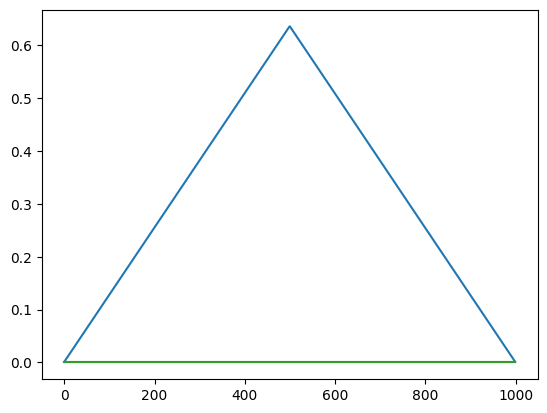

11


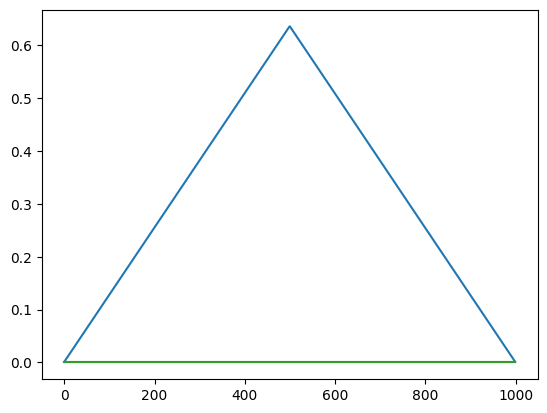

12


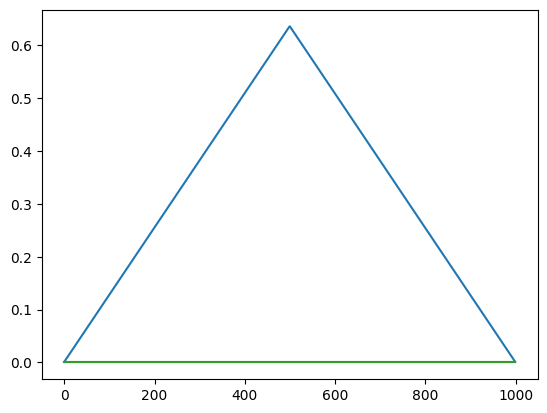

13


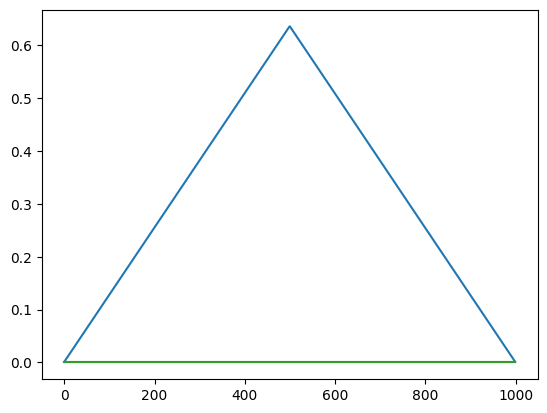

14


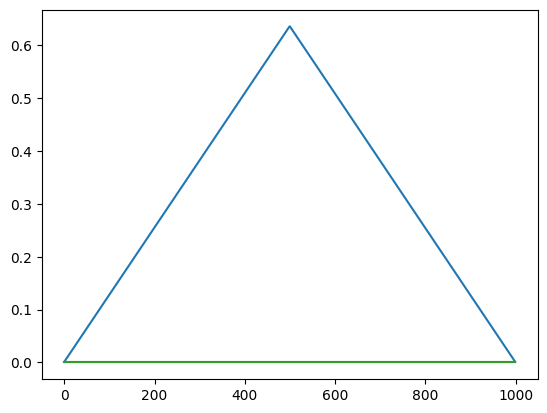

15


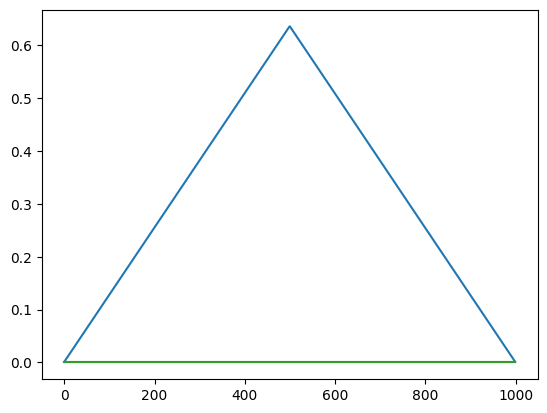

16


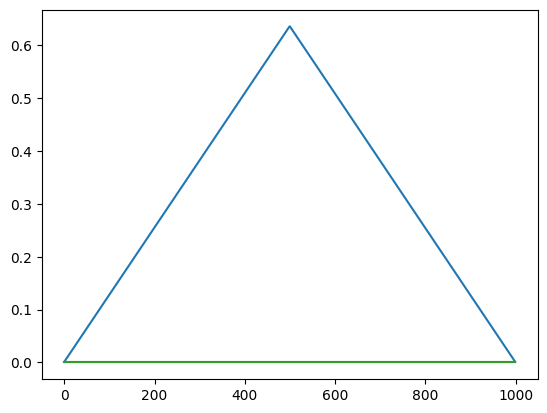

17


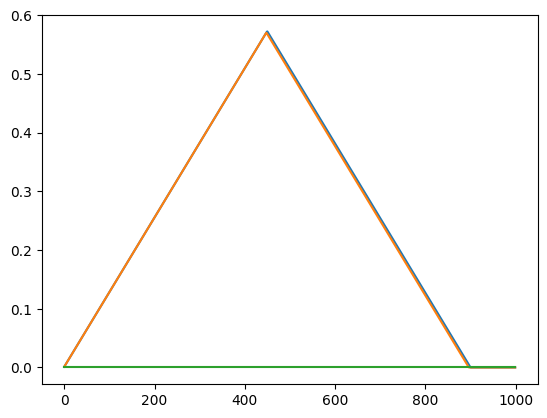

18


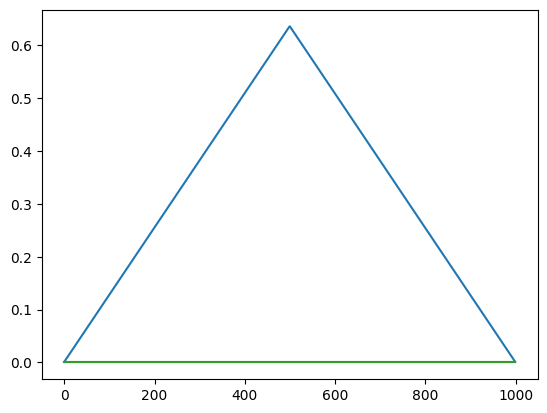

19


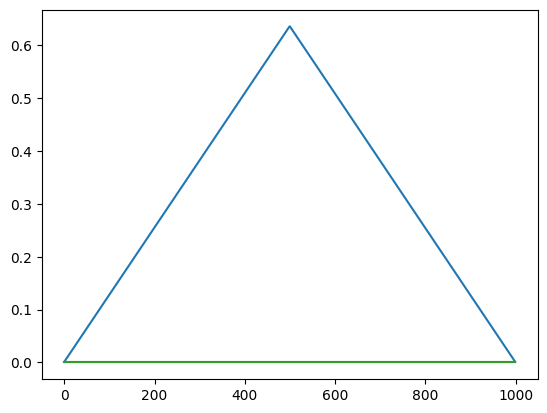

20


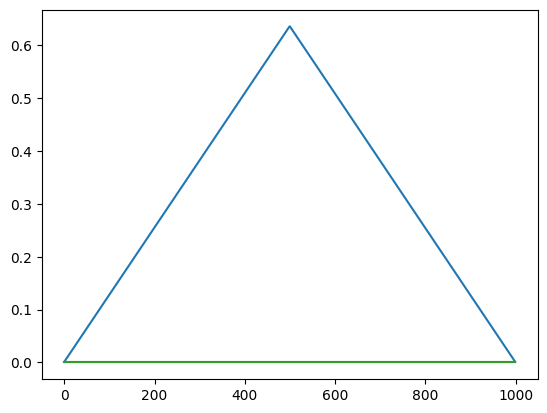

21


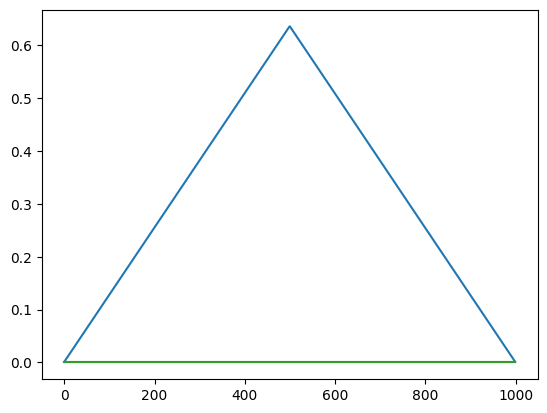

22


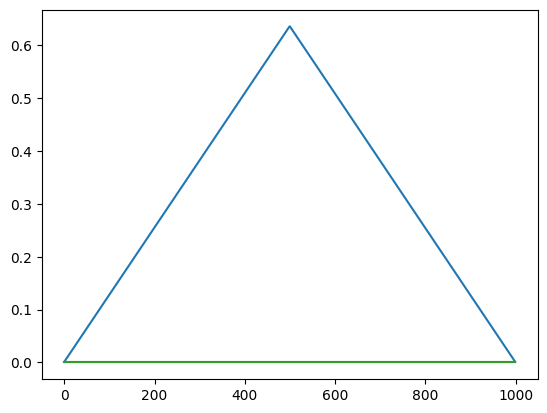

23


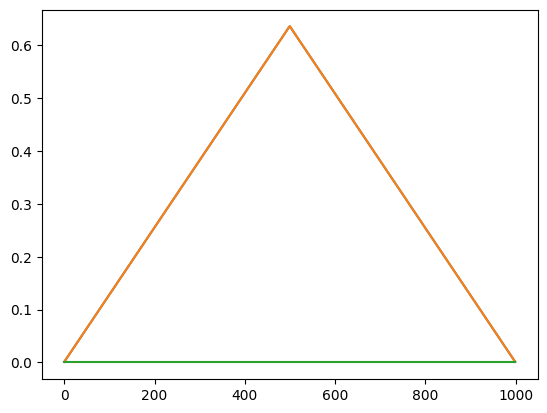

24


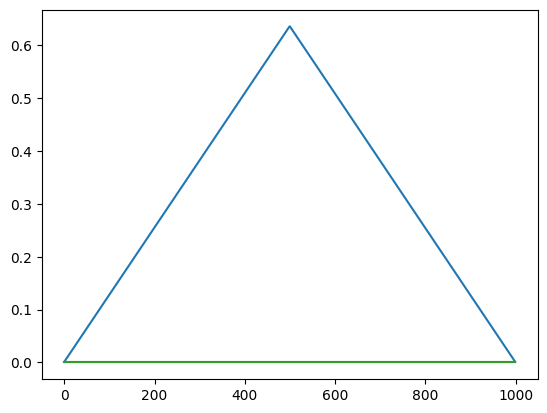

25


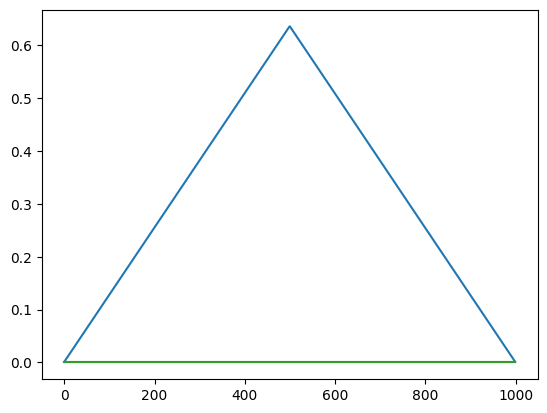

26


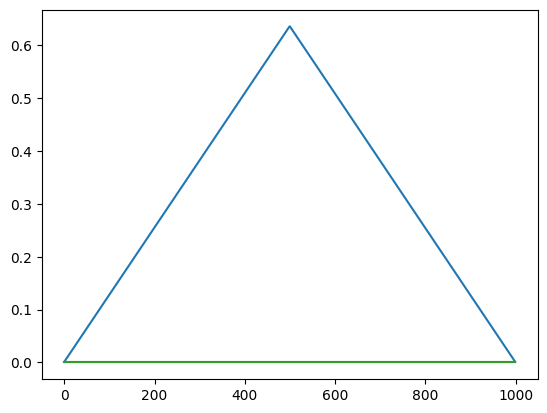

27


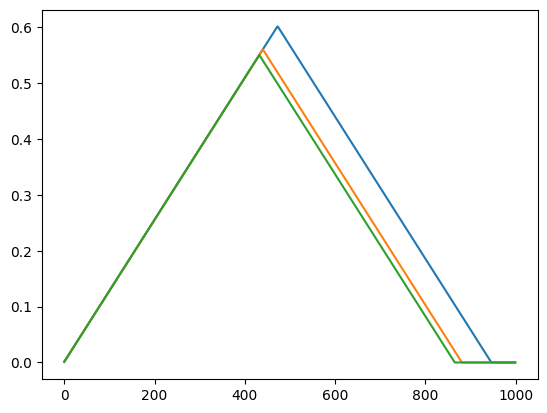

28


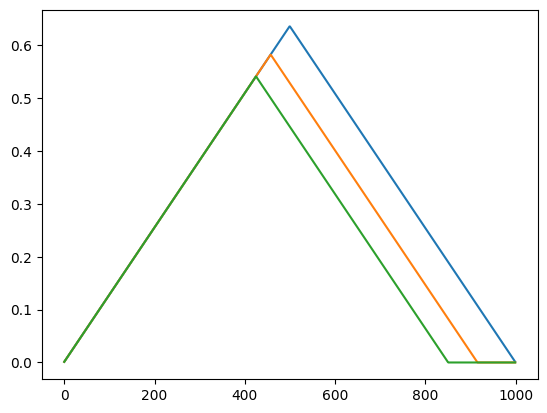

29


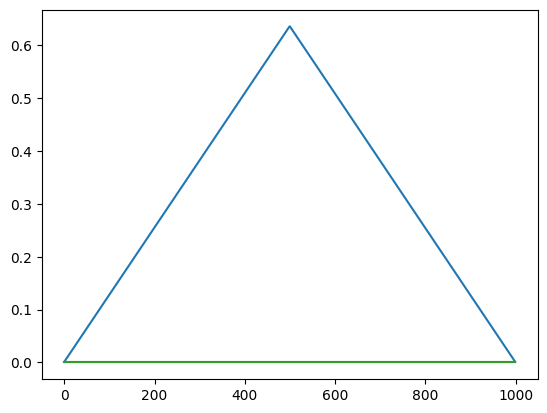

30


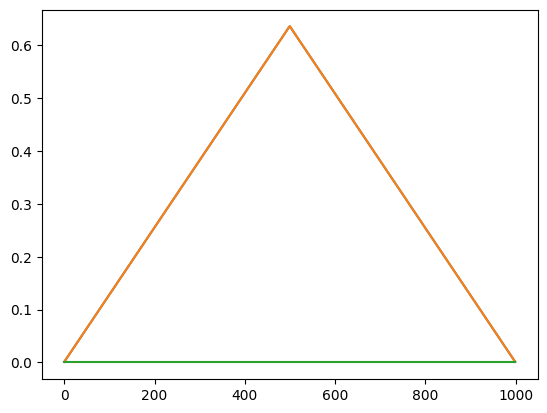

31


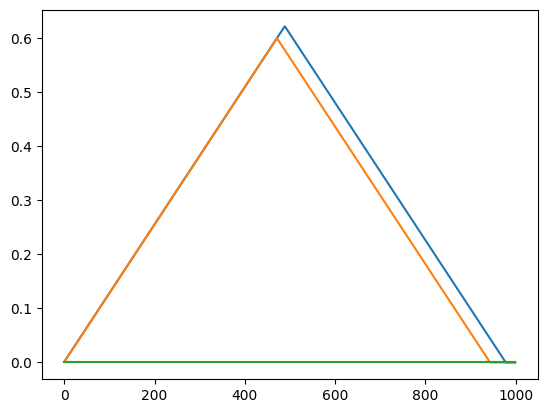

32


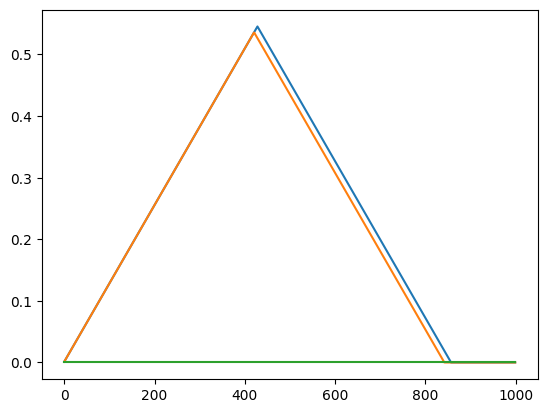

33


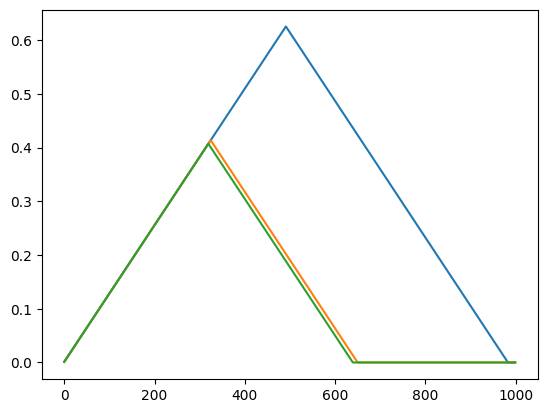

34


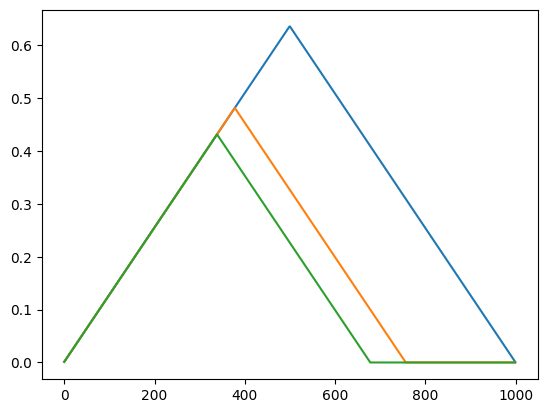

35


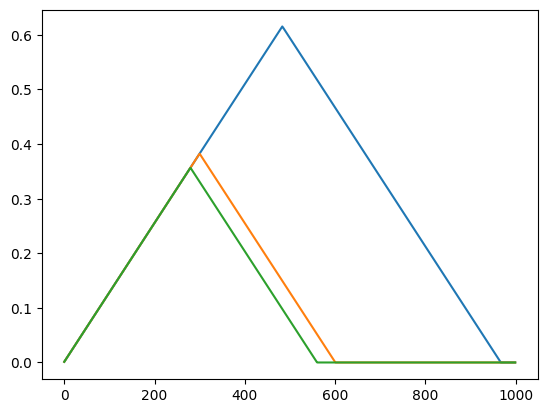

36


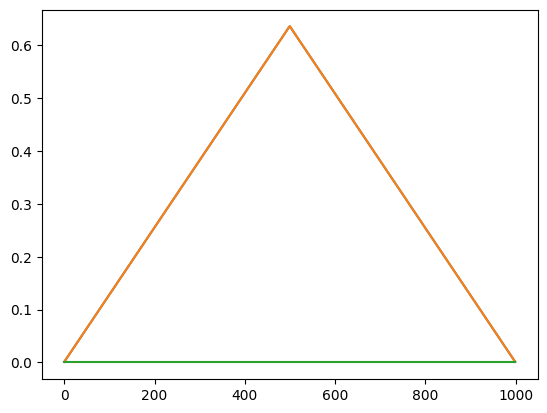

37


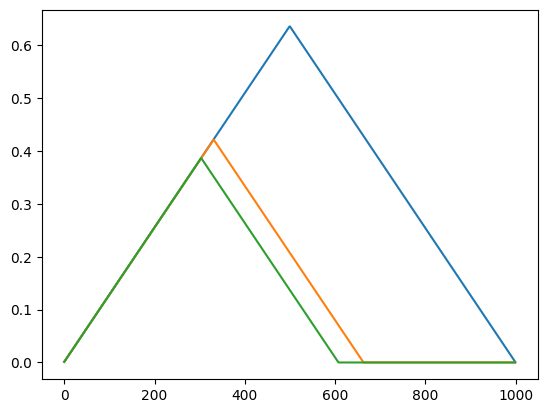

38


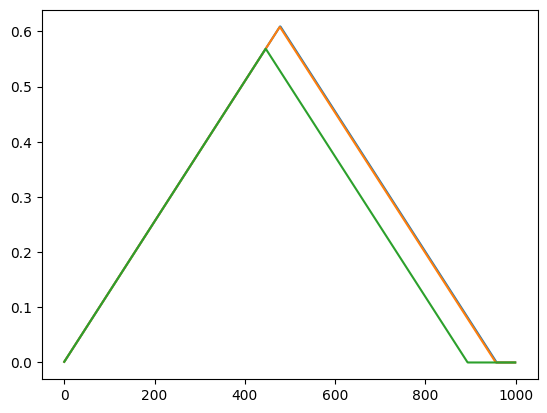

39


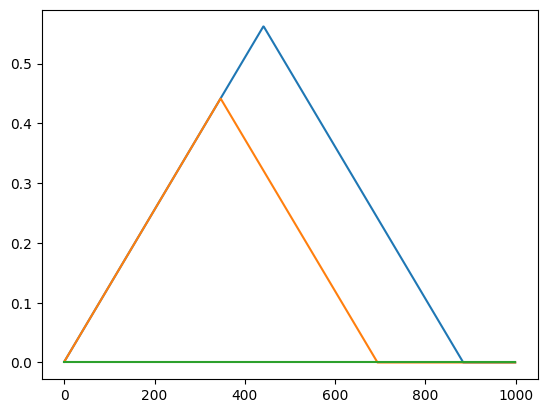

40


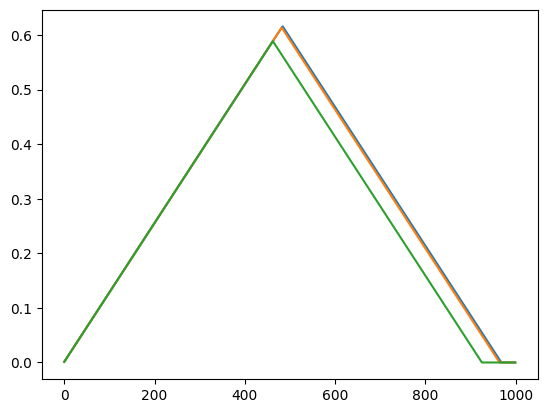

41


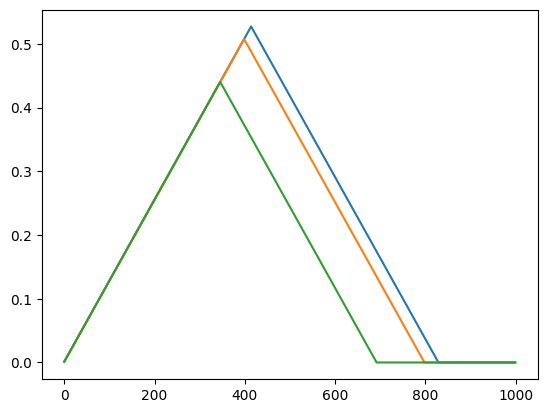

42


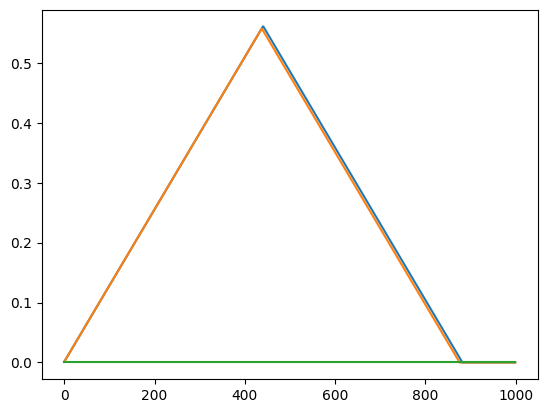

43


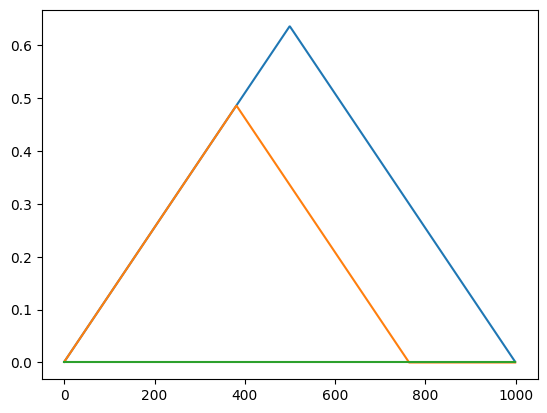

44


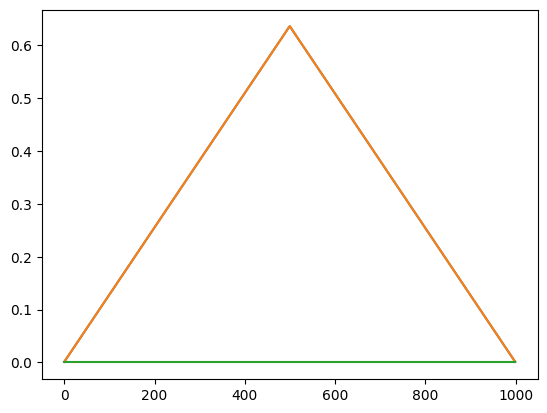

45


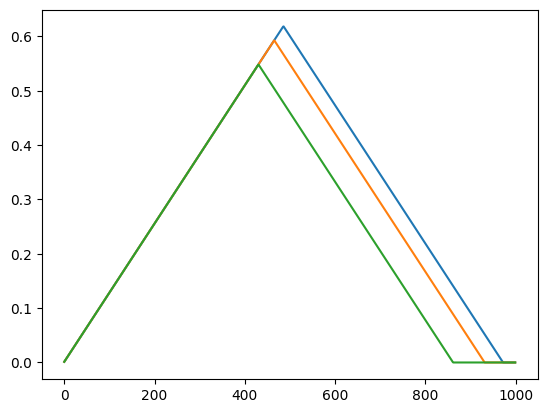

46


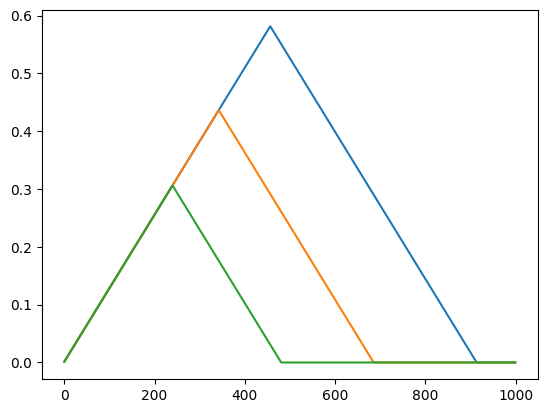

47


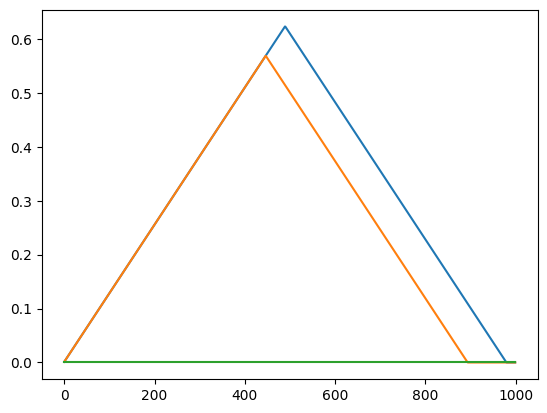

48


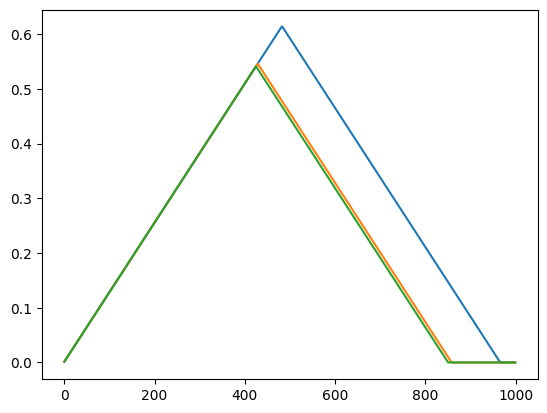

49


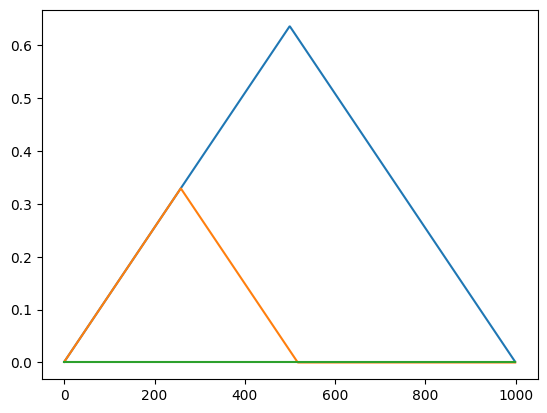

50


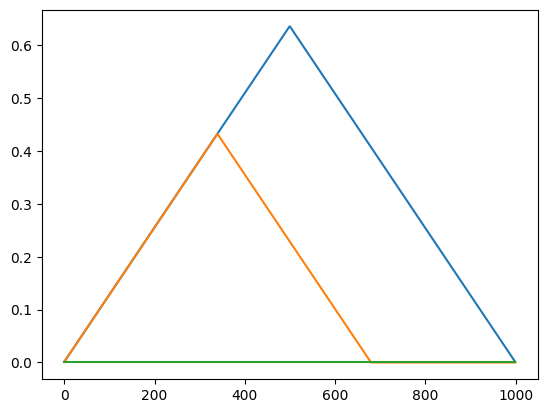

51


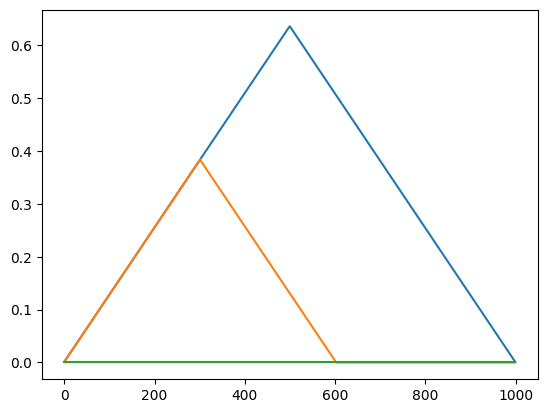

52


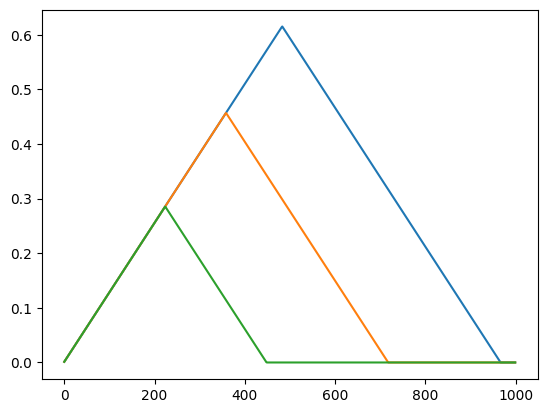

53


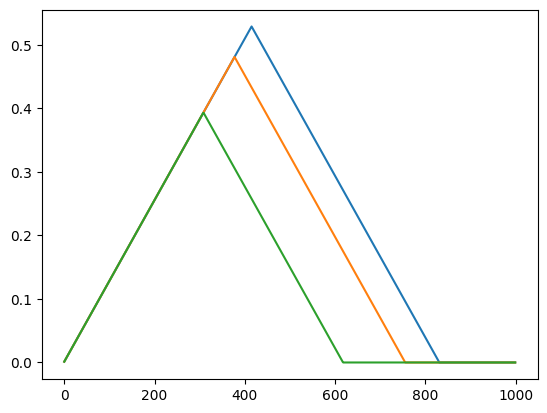

54


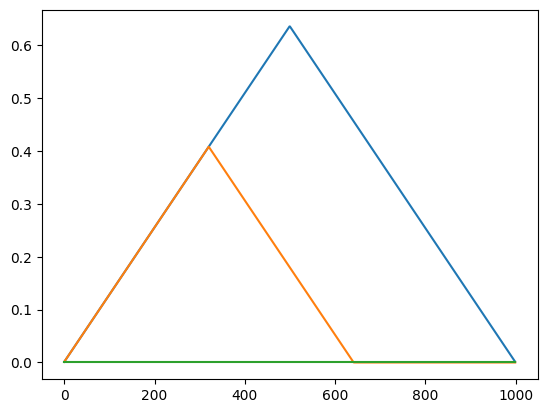

55


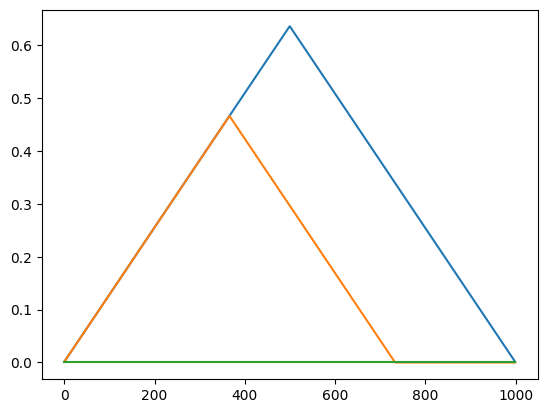

56


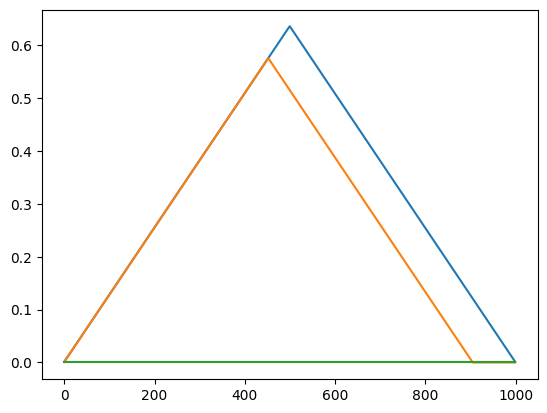

57


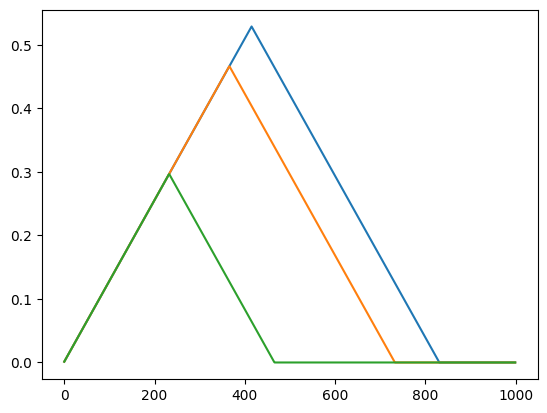

58


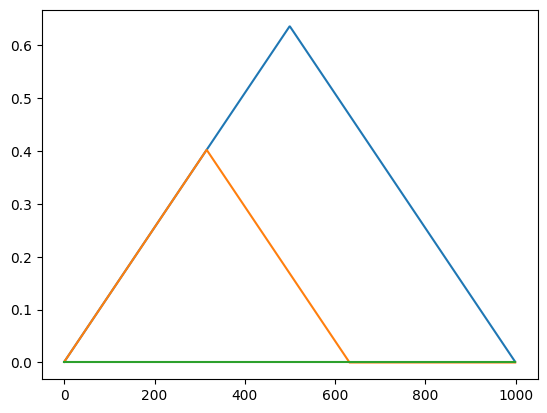

59


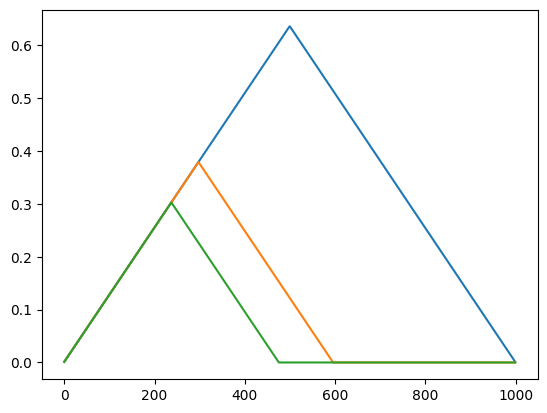

60


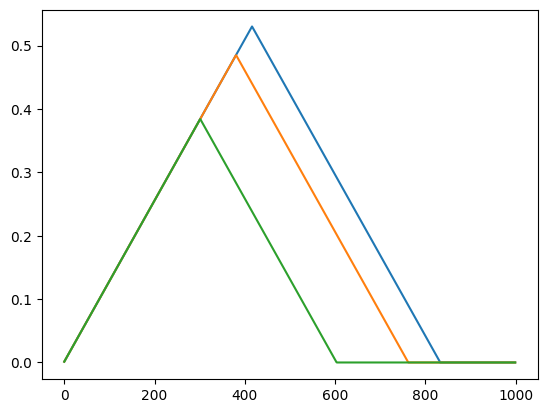

61


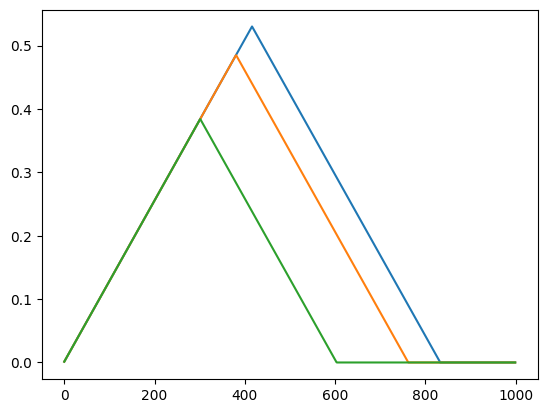

62


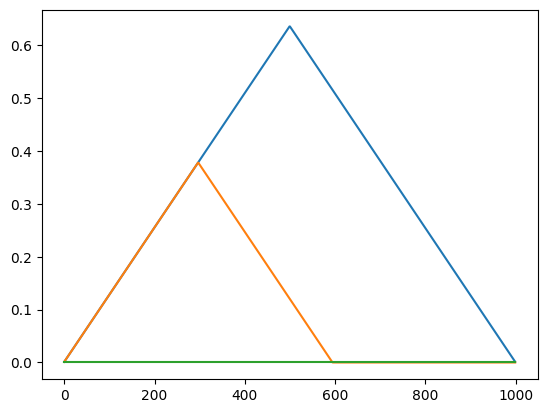

63


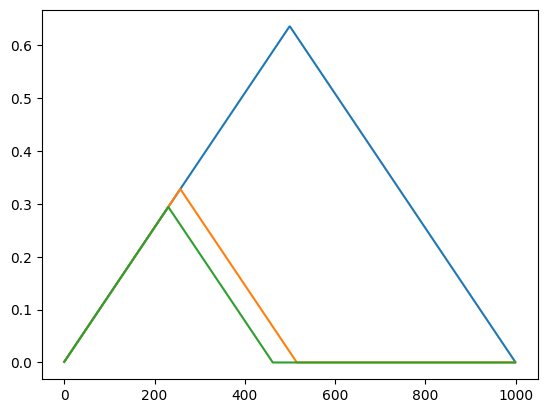

64


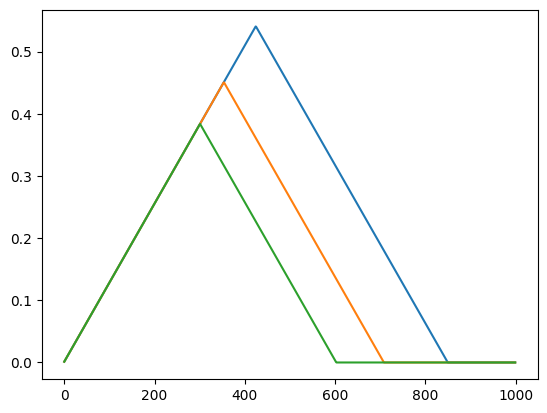

65


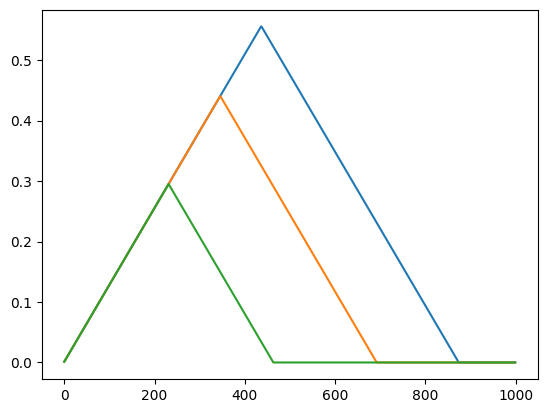

66


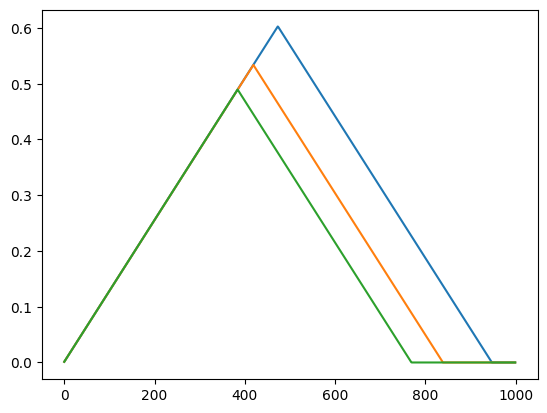

67


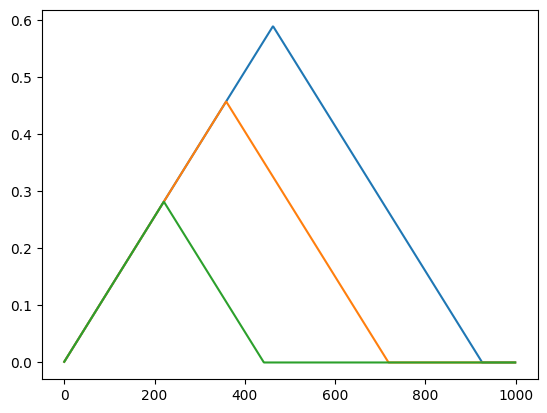

68


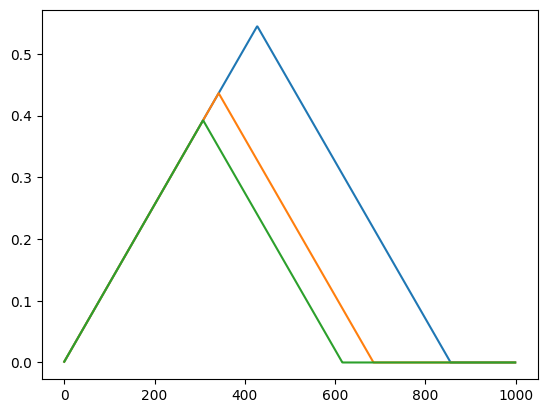

69


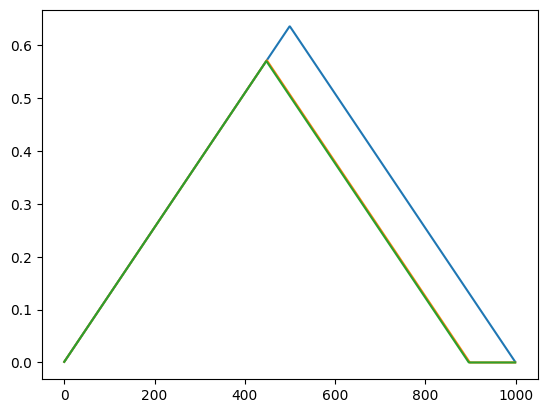

70


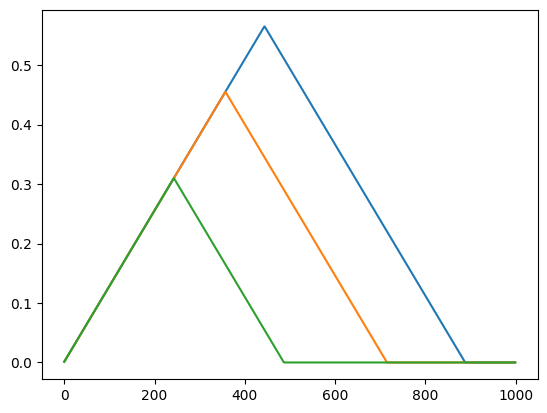

71


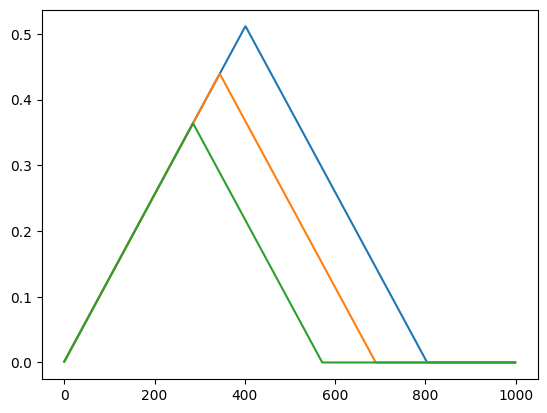

72


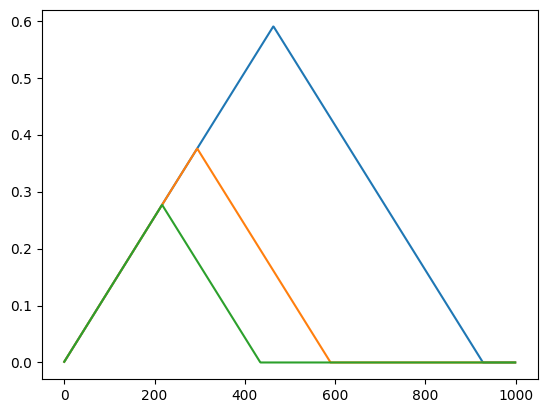

73


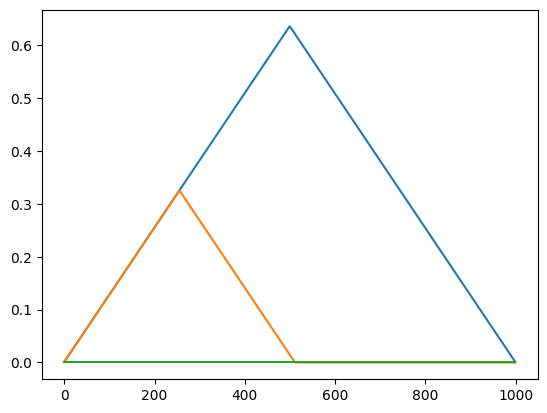

74


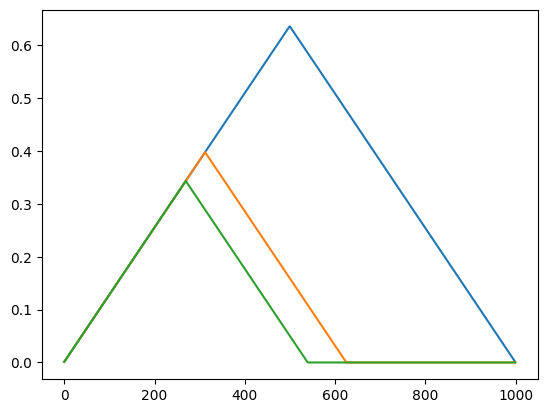

75


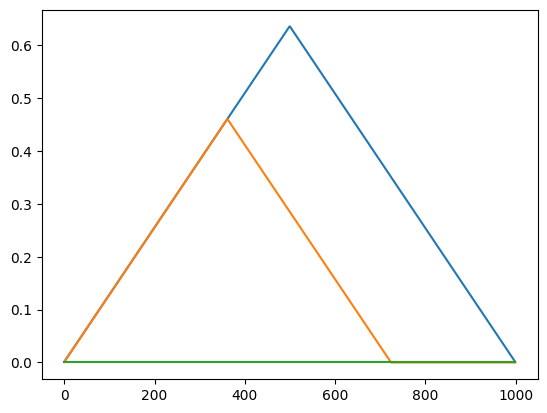

76


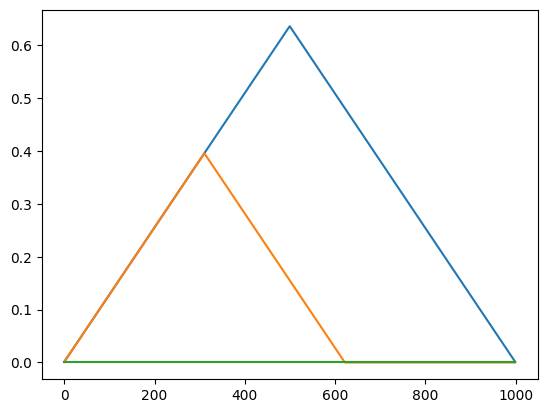

77


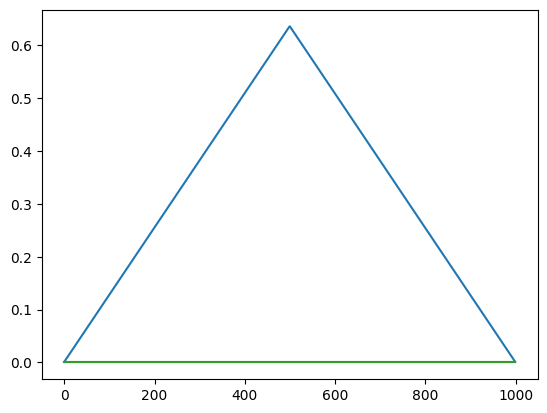

78


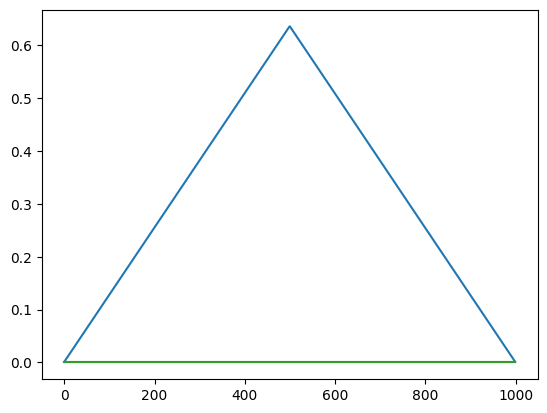

79


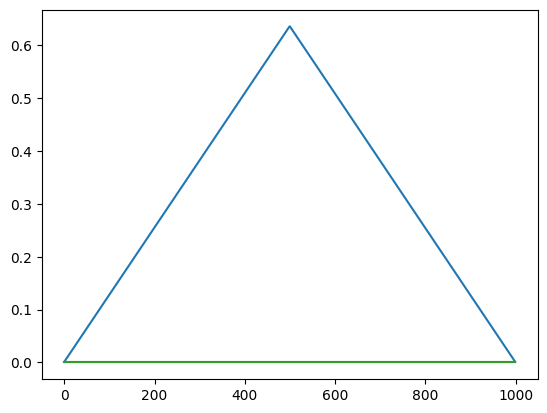

80


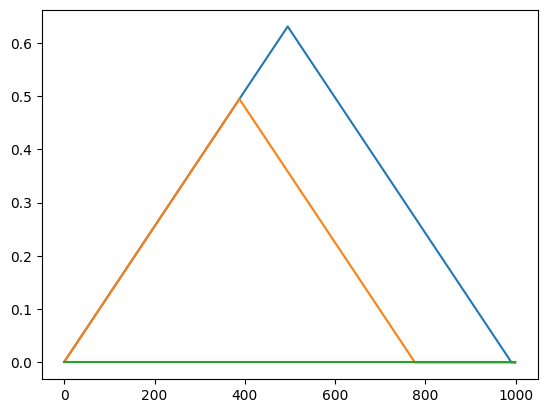

81


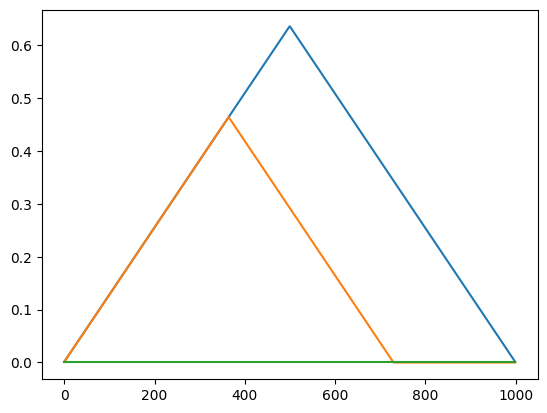

82


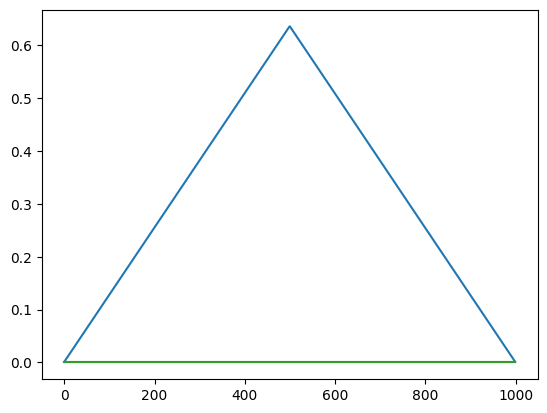

83


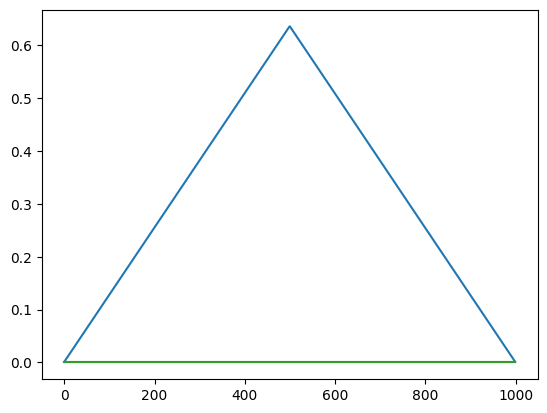

84


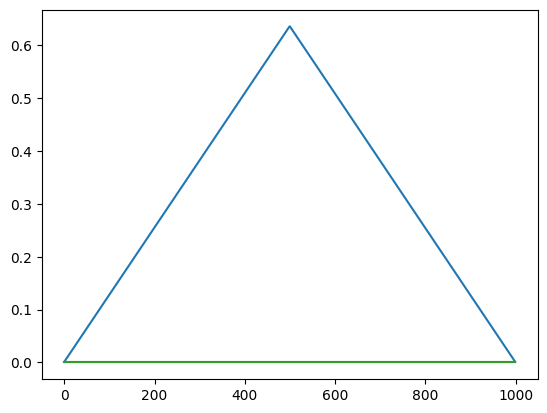

85


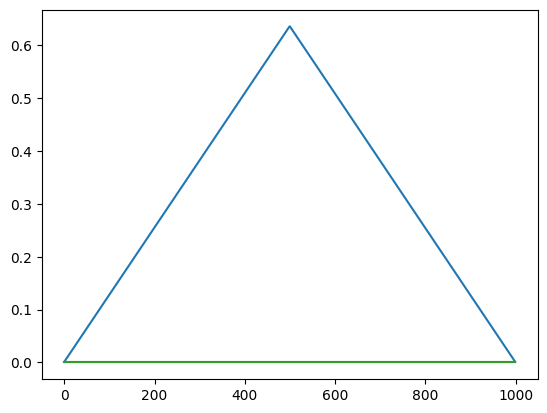

86


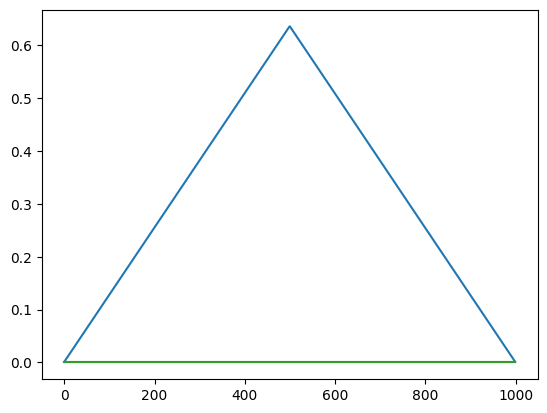

87


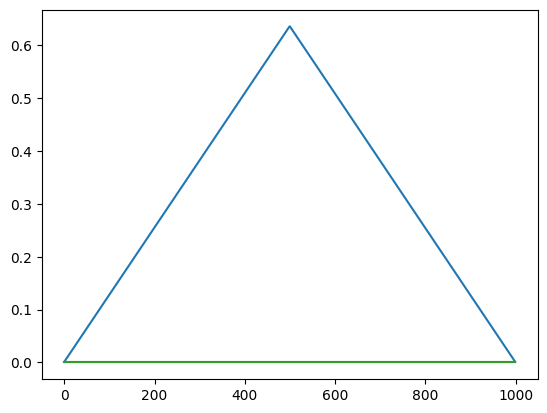

88


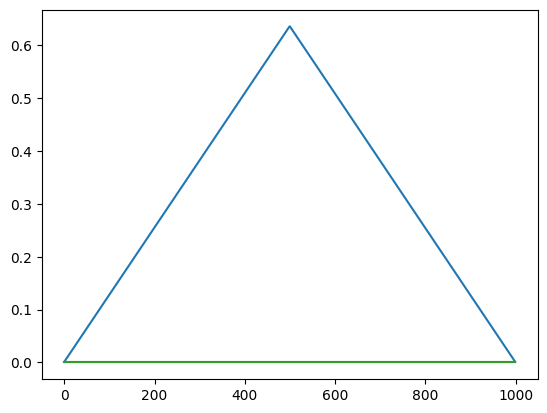

89


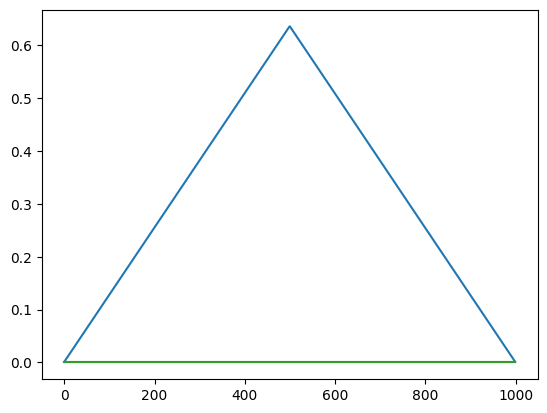

90


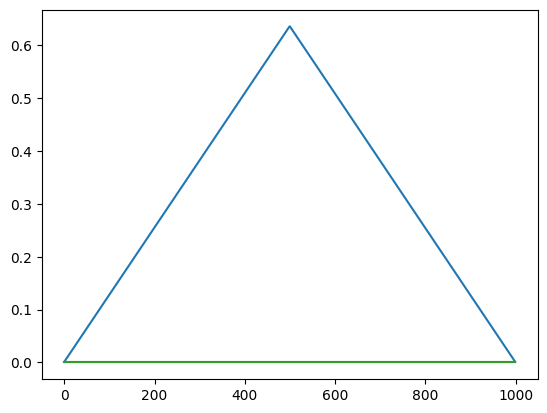

91


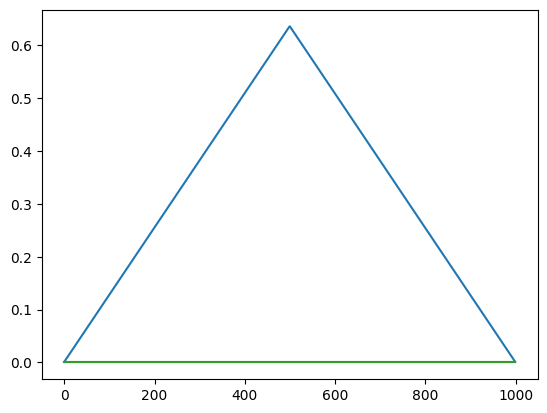

92


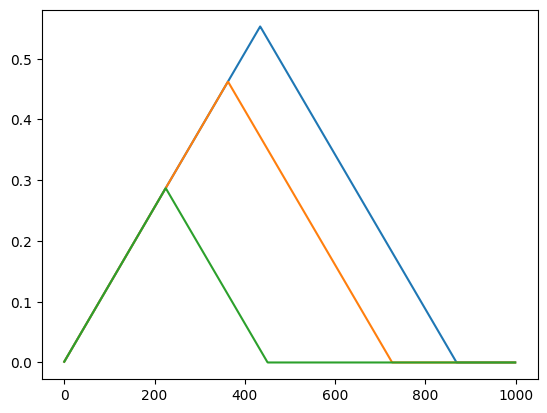

93


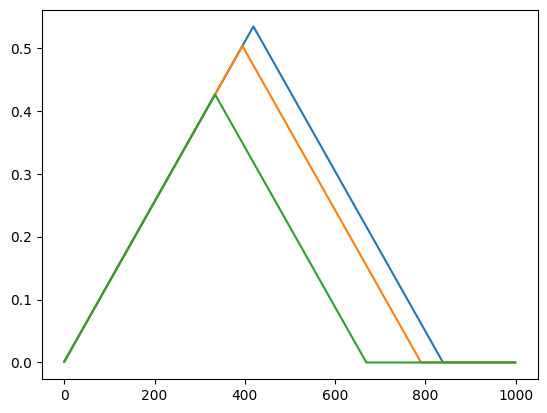

94


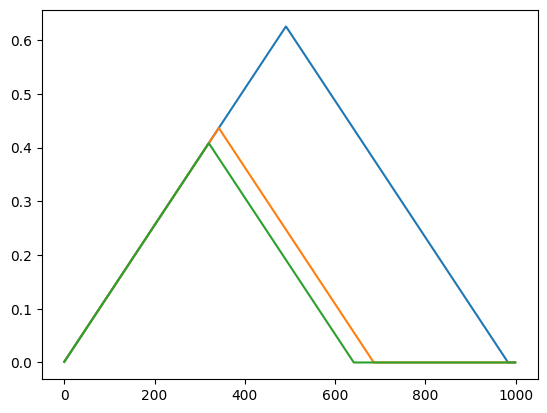

95


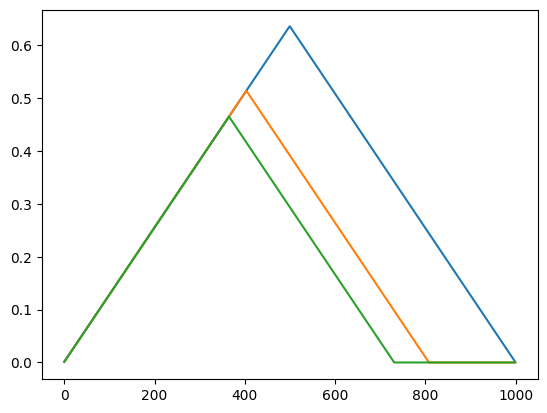

96


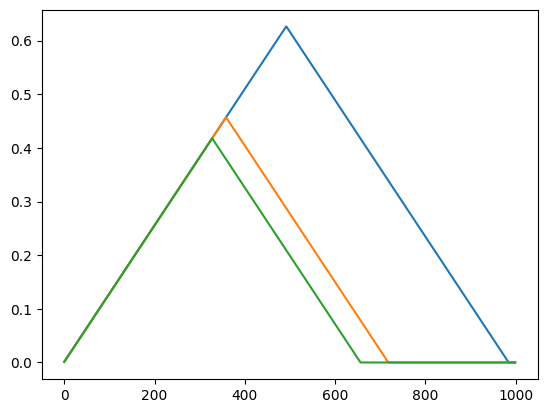

97


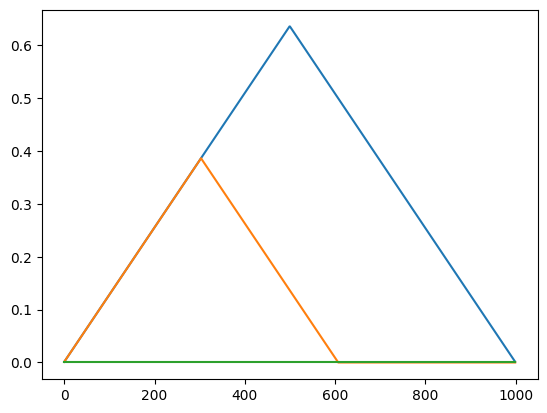

98


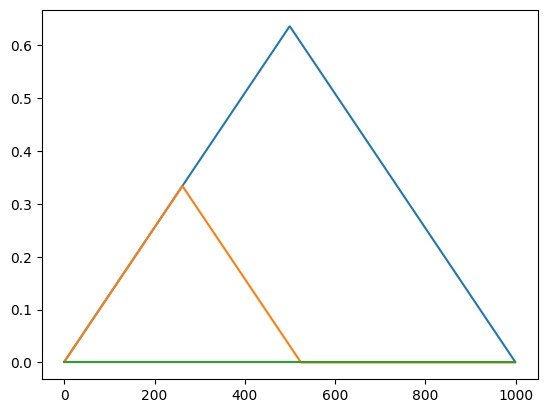

99


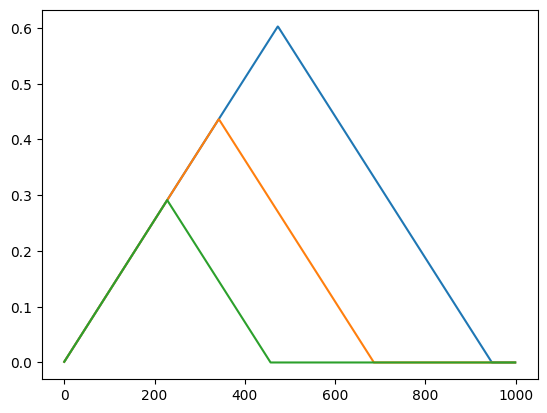

100


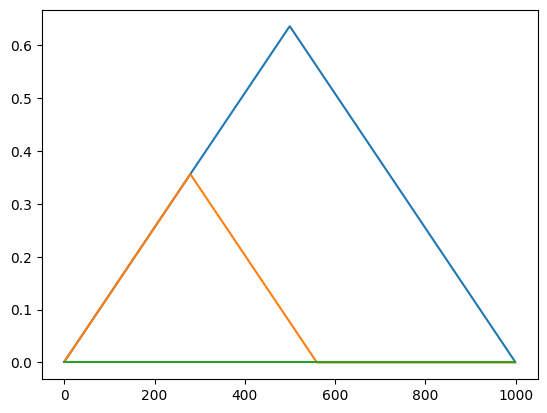

101


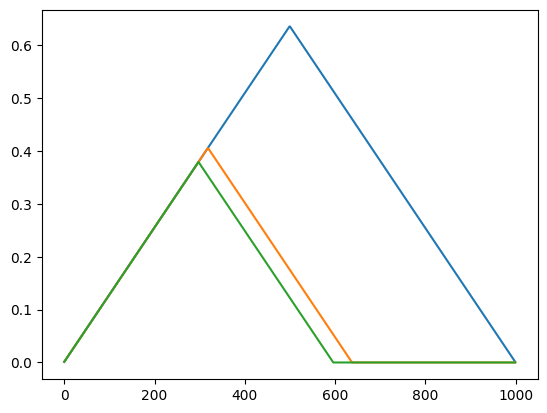

102


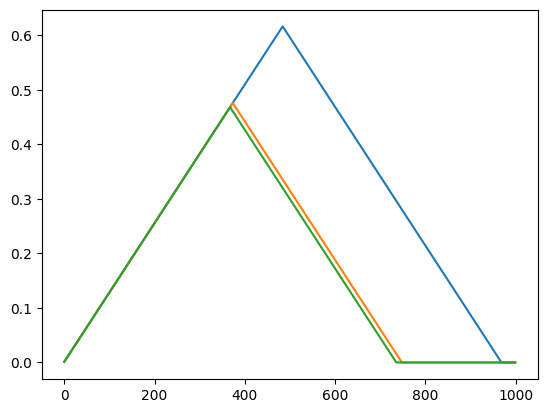

103


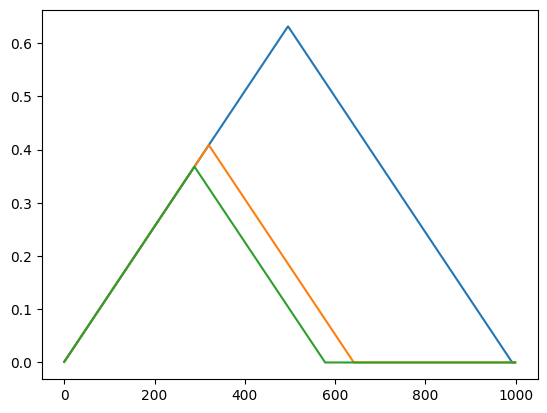

104


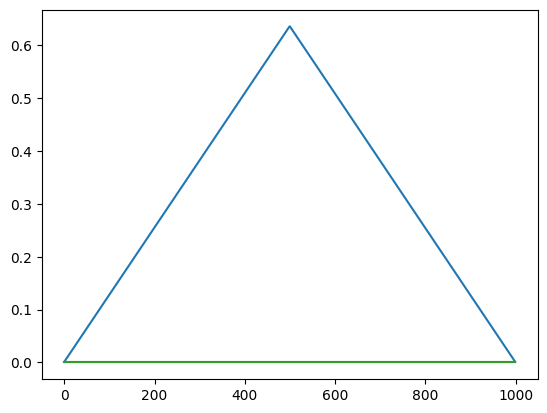

105


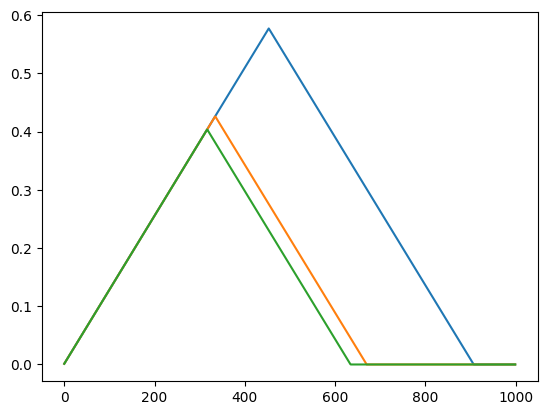

106


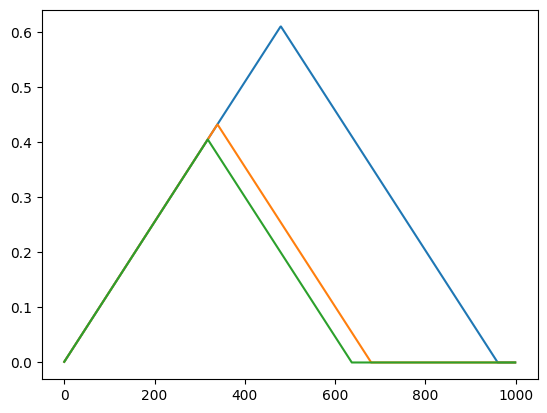

107


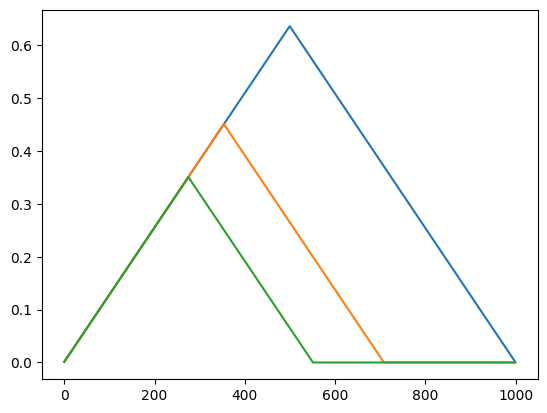

108


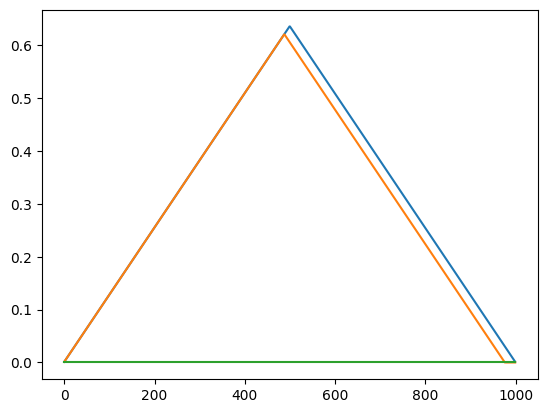

109


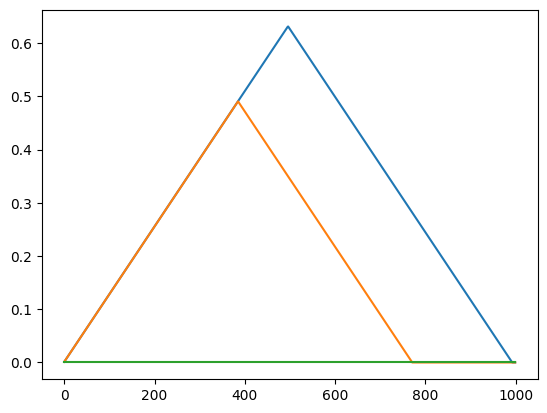

110


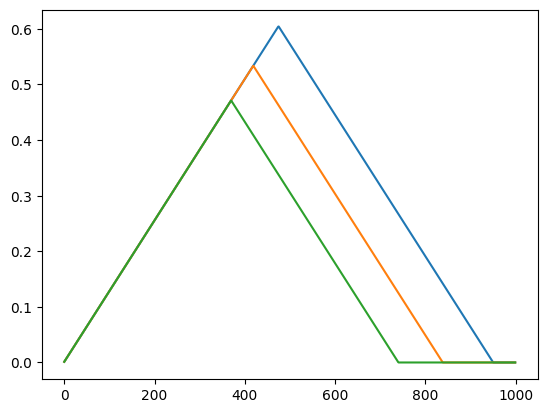

111


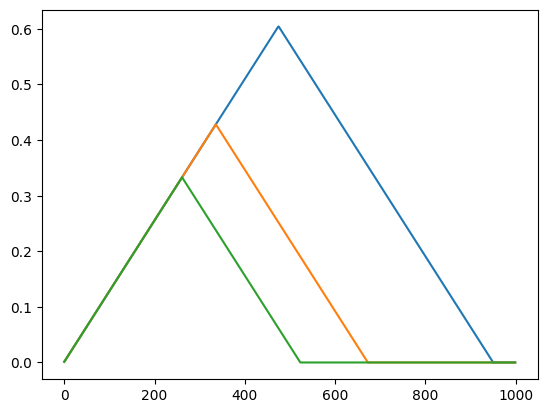

112


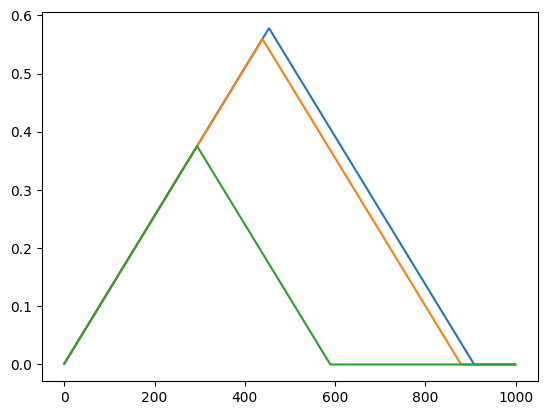

113


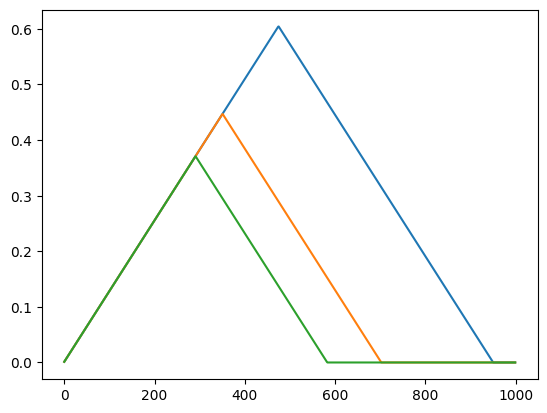

114


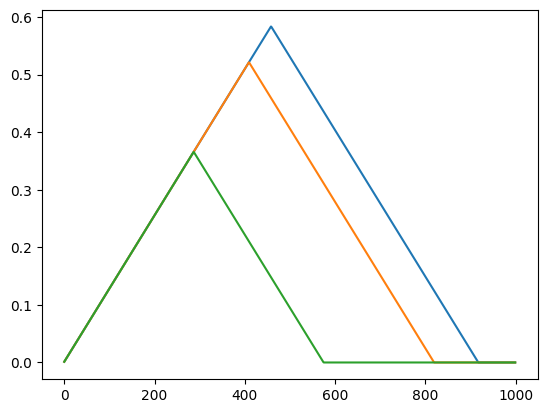

115


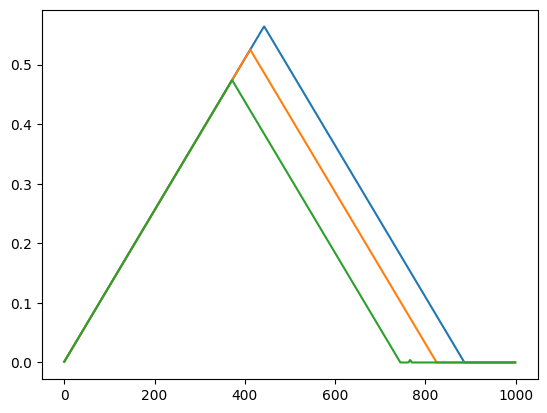

116


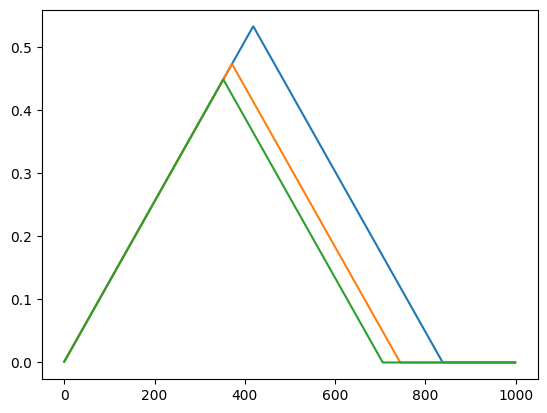

117


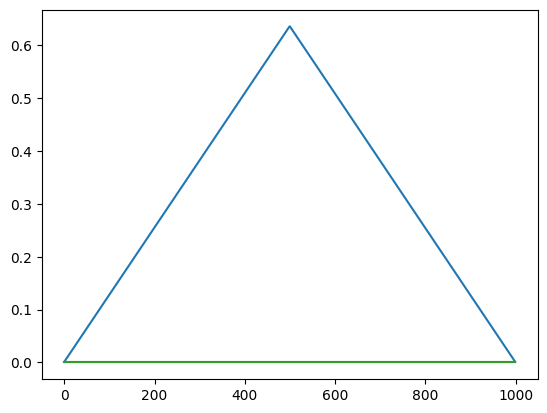

118


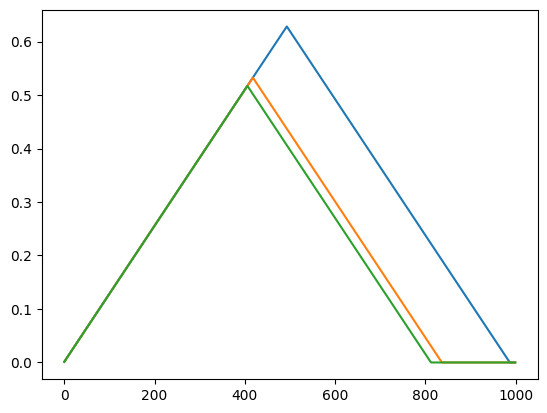

119


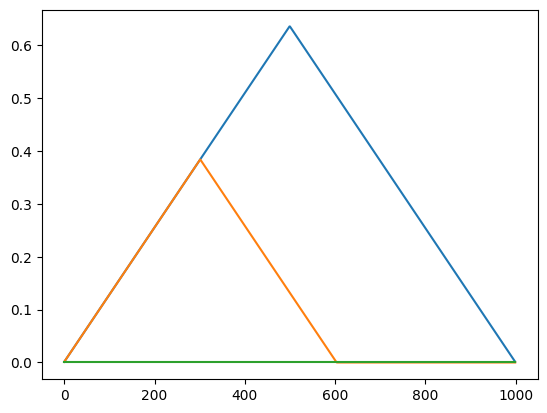

120


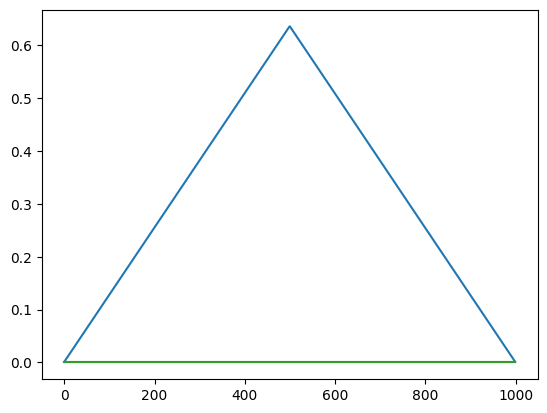

121


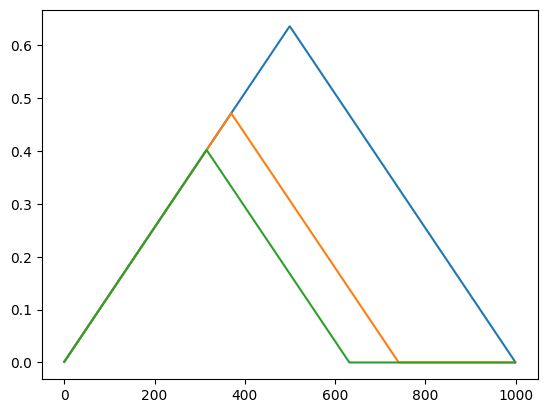

122


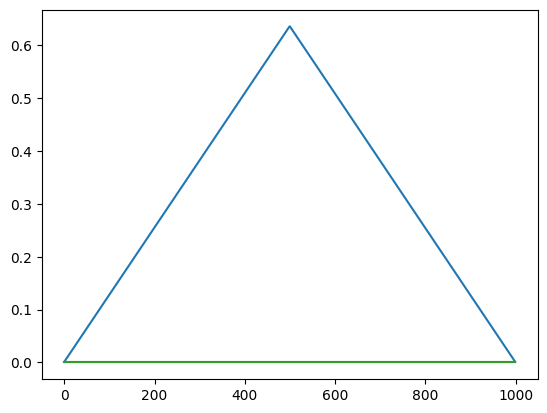

123


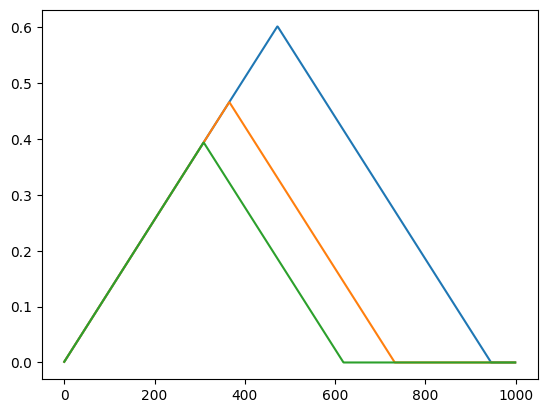

124


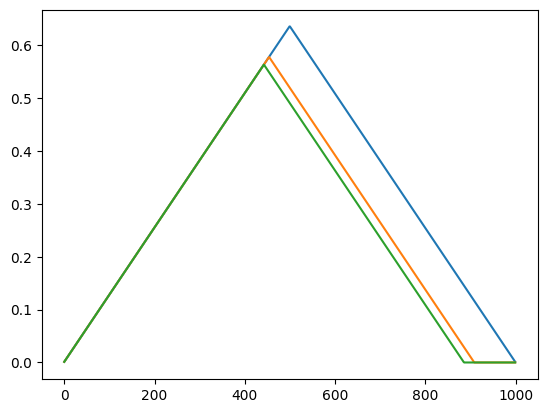

125


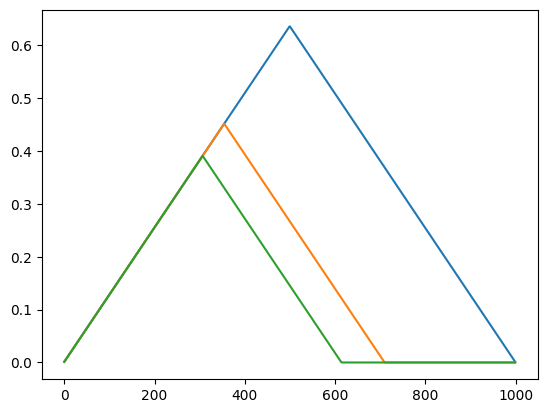

126


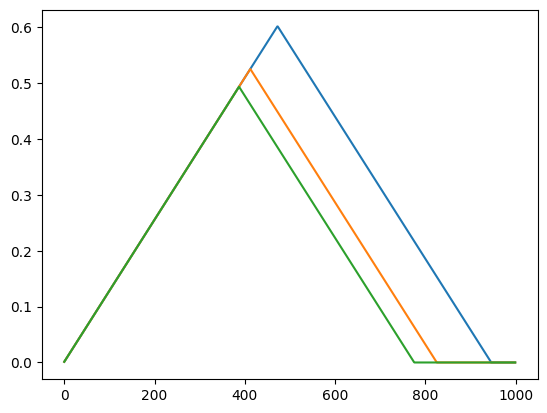

127


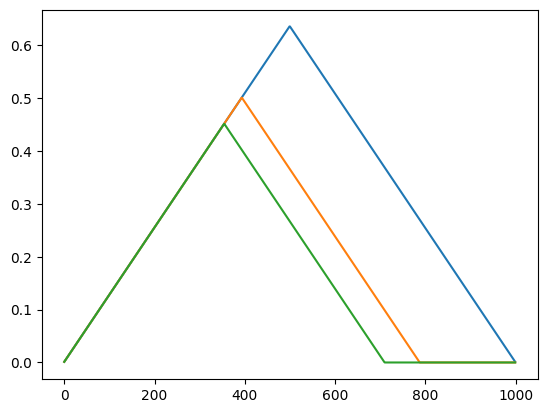

128


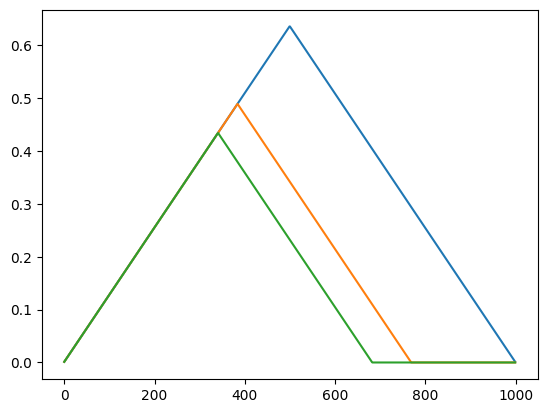

129


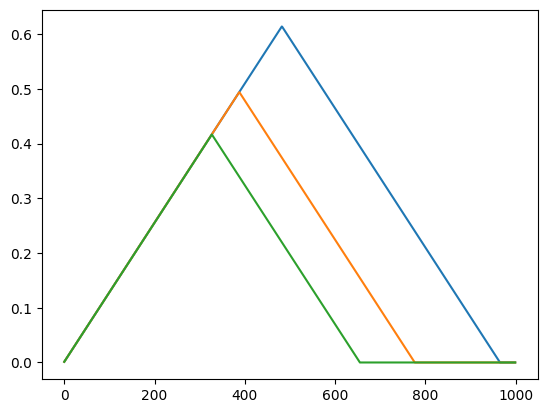

130


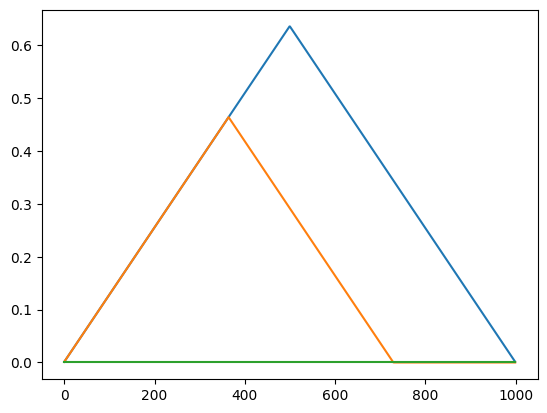

131


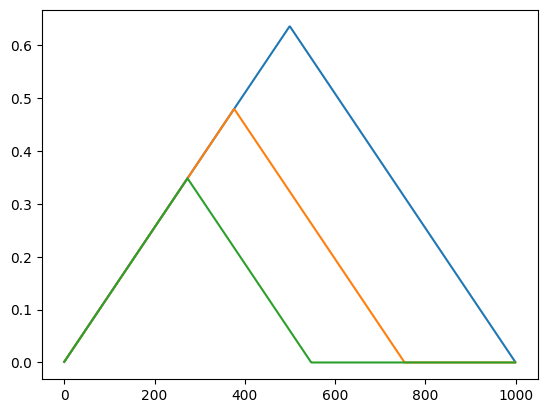

132


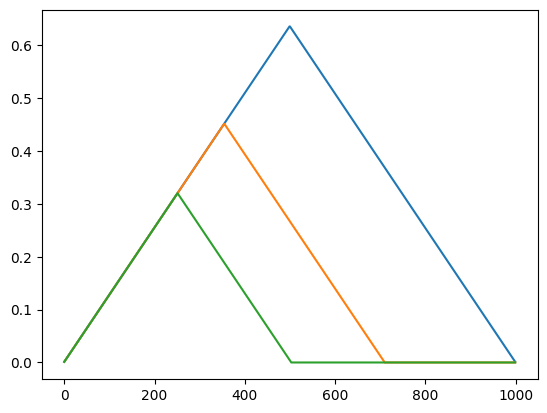

133


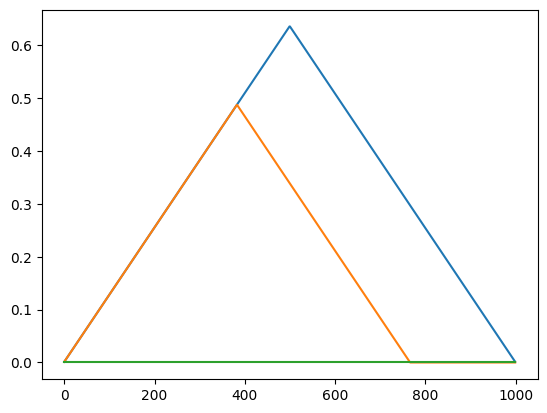

134


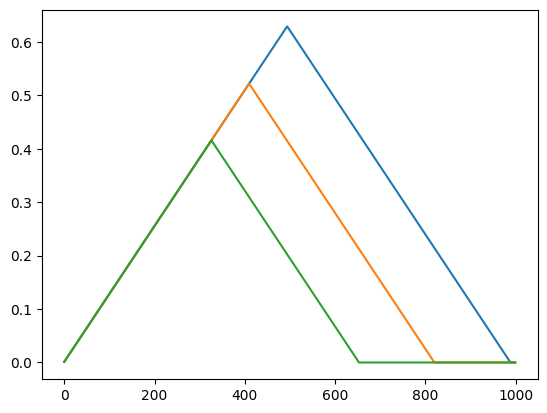

135


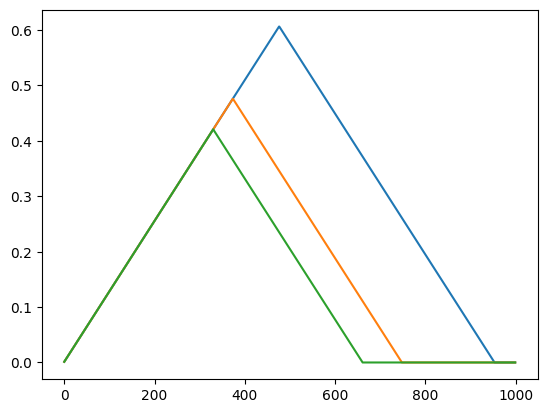

136


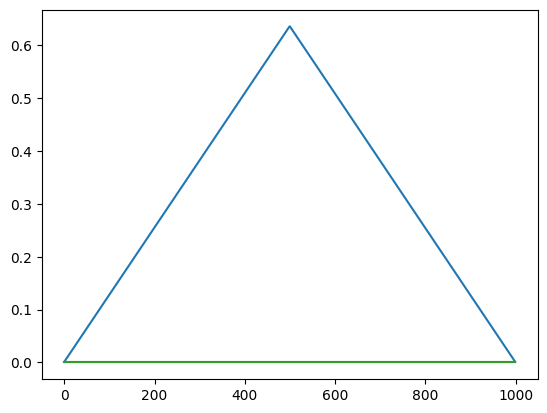

137


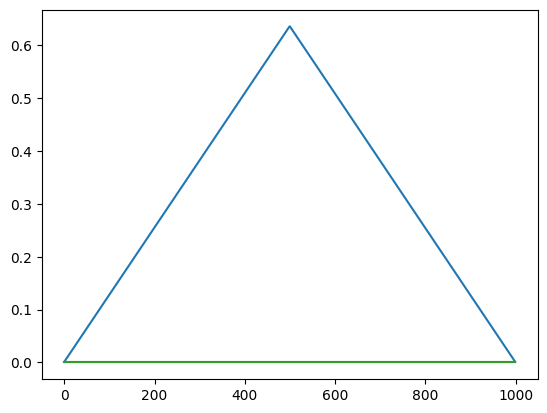

138


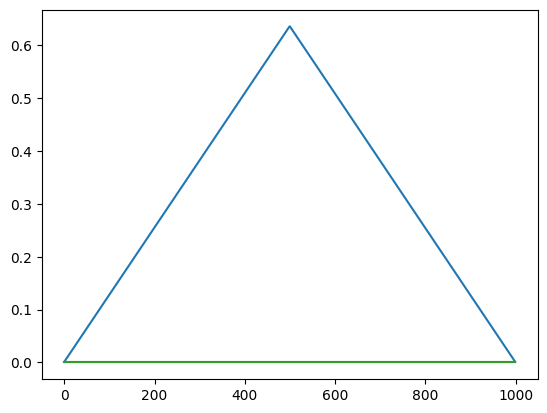

139


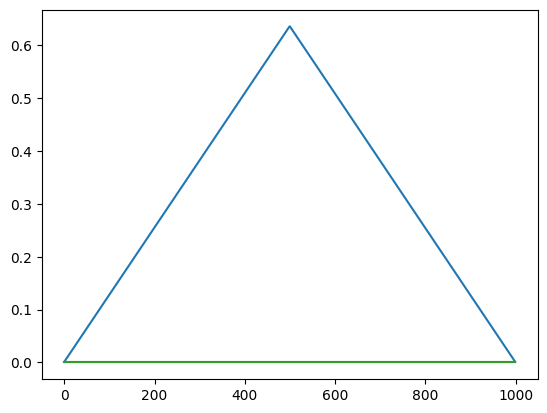

140


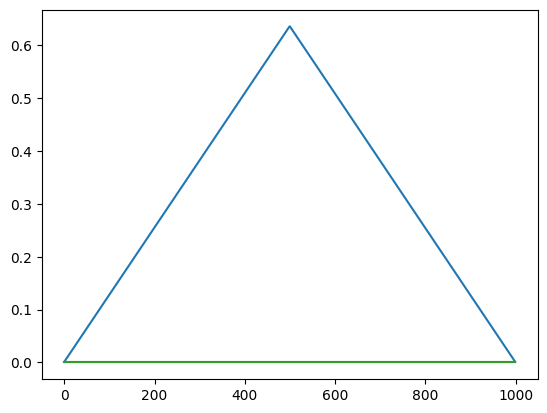

141


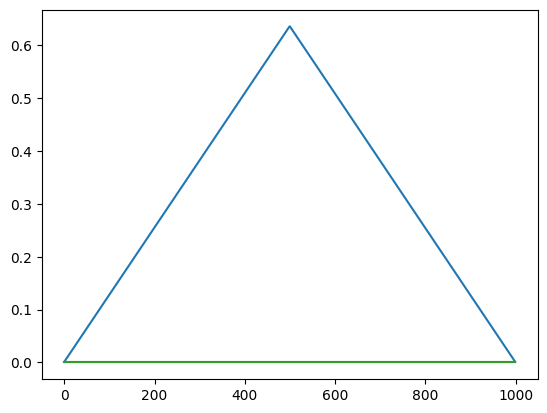

142


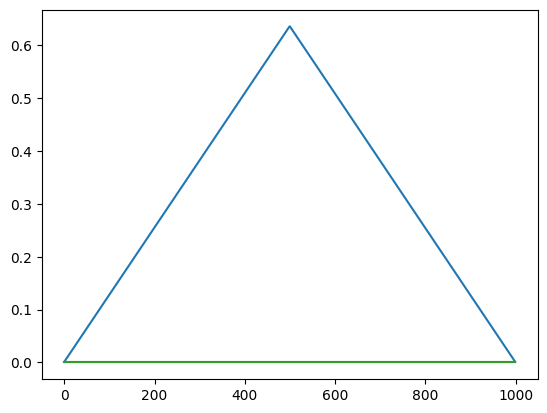

143


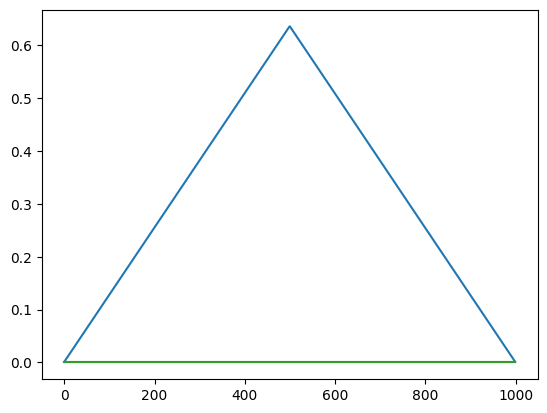

144


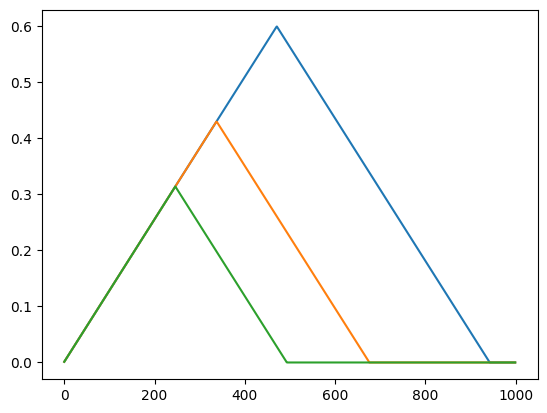

145


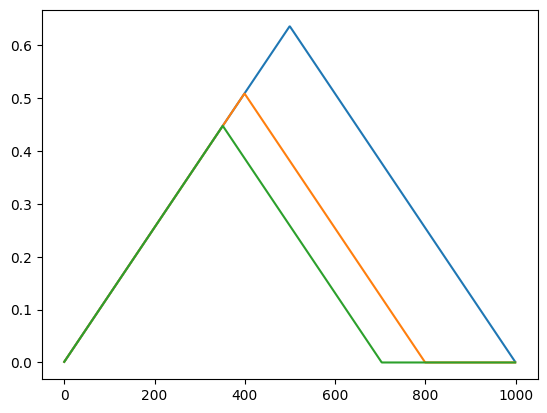

146


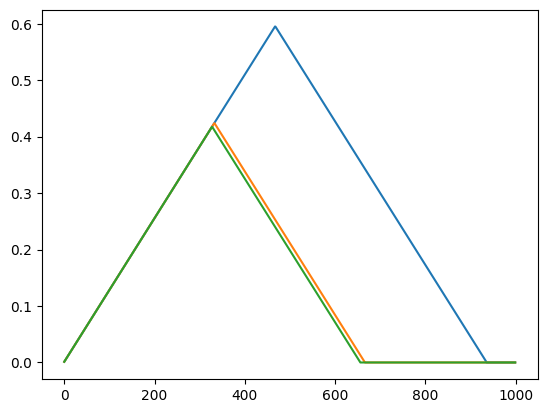

147


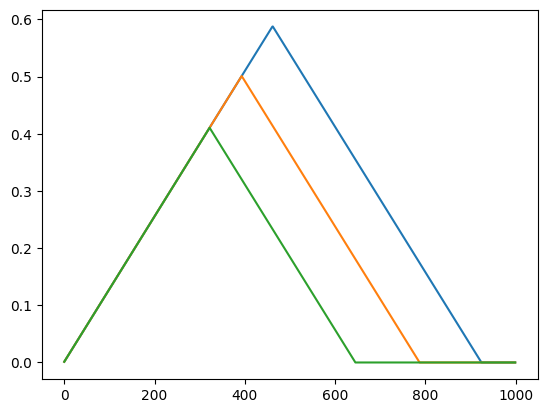

148


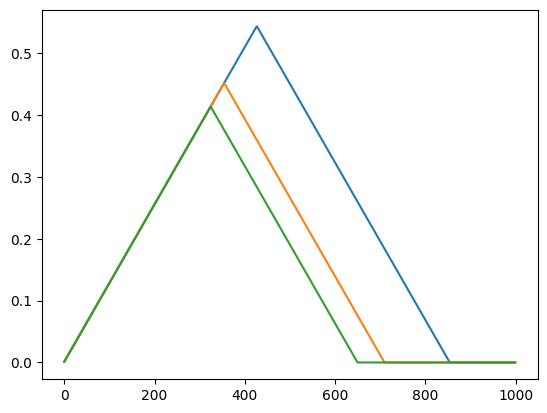

149


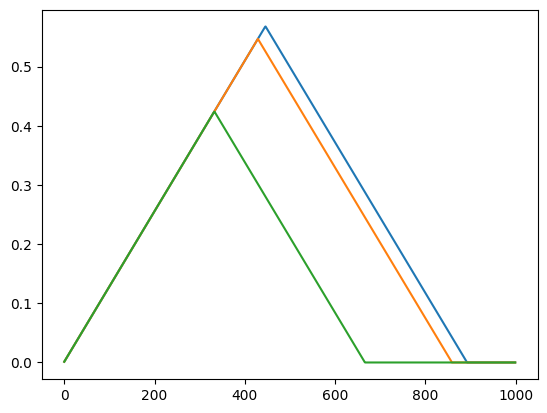

150


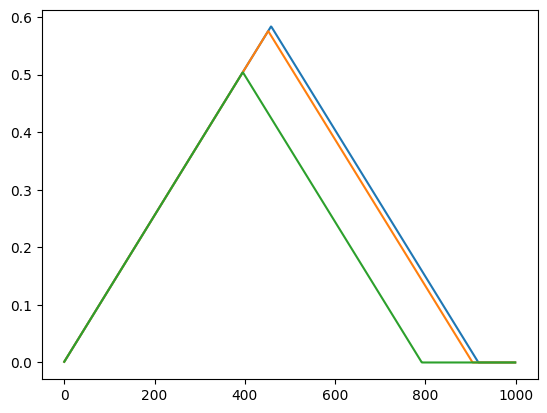

151


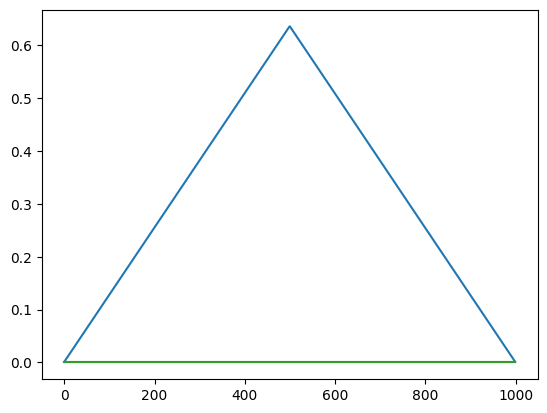

152


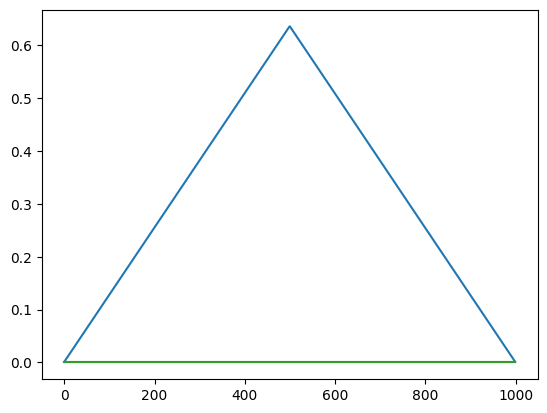

153


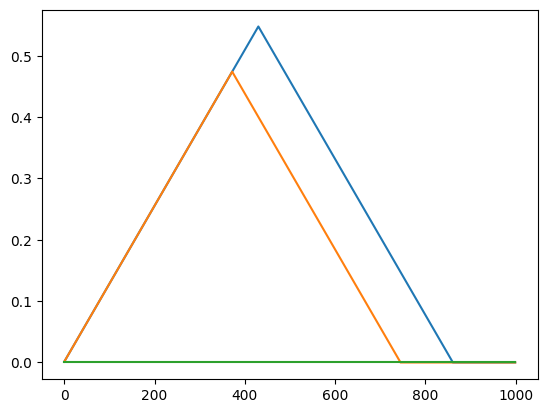

154


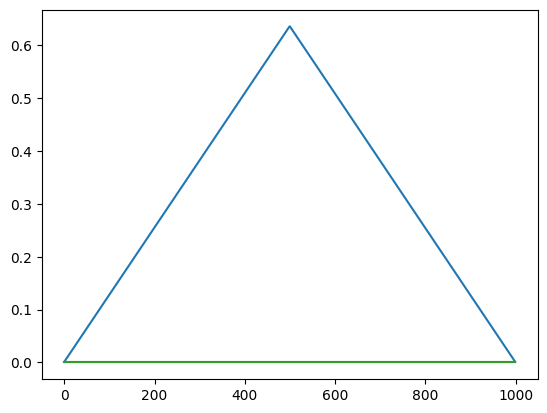

155


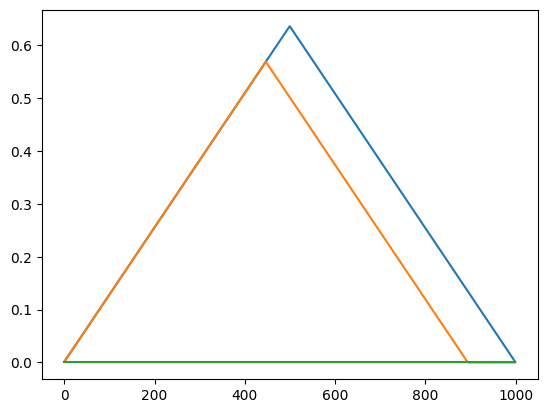

156


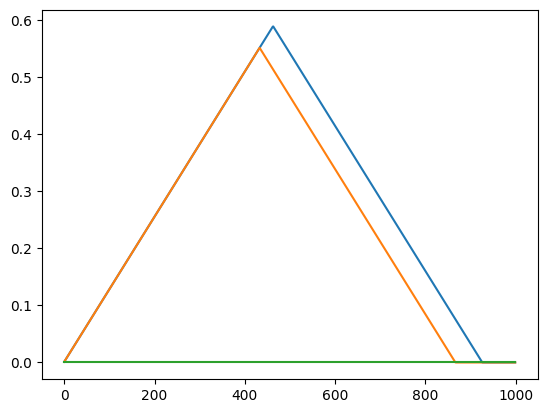

157


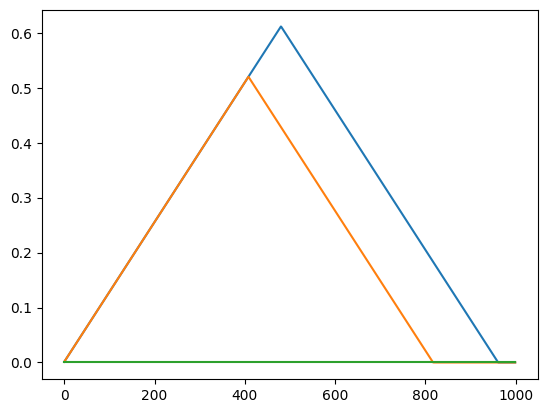

158


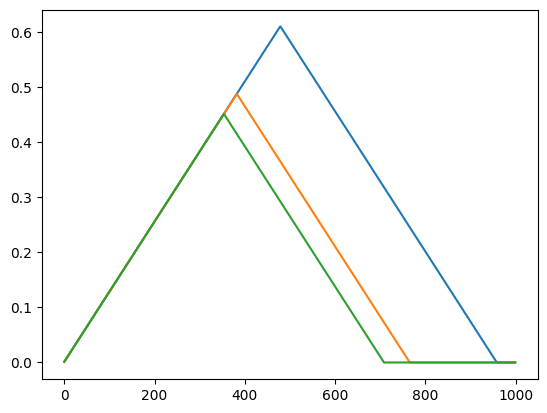

159


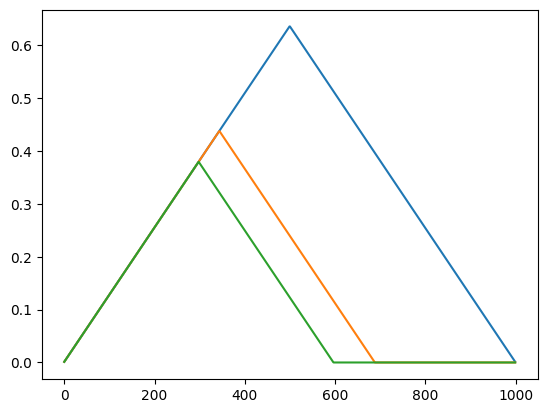

160


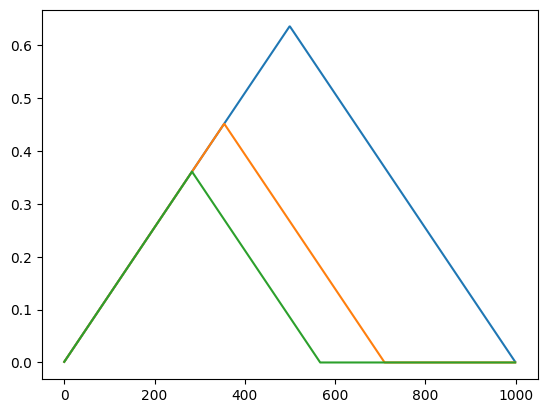

161


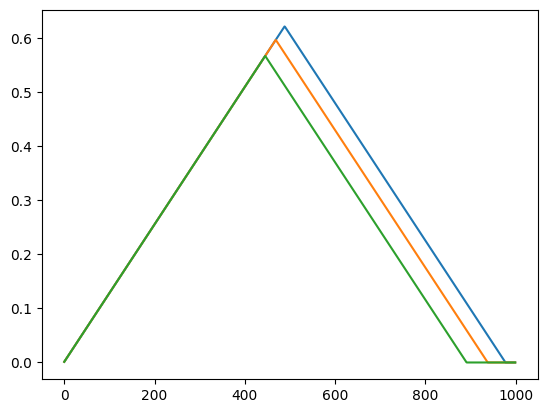

162


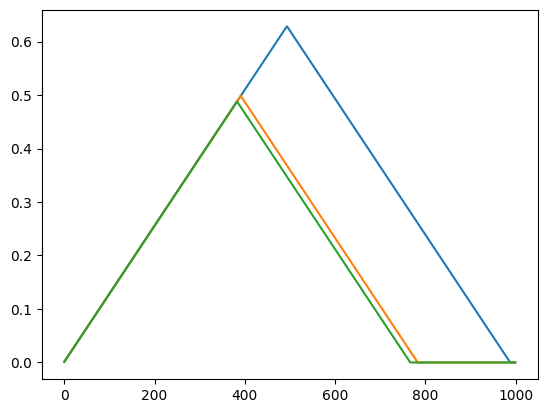

163


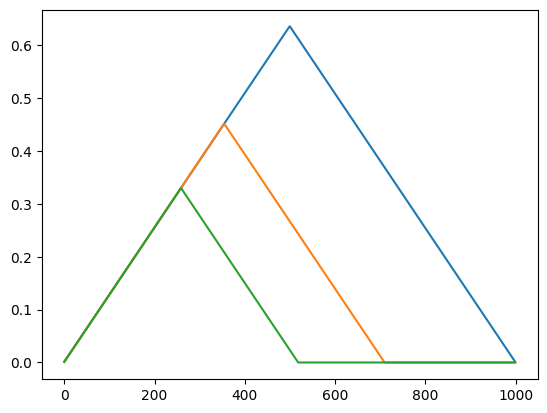

164


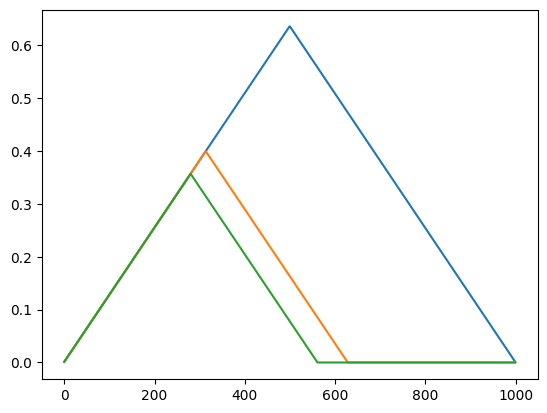

165


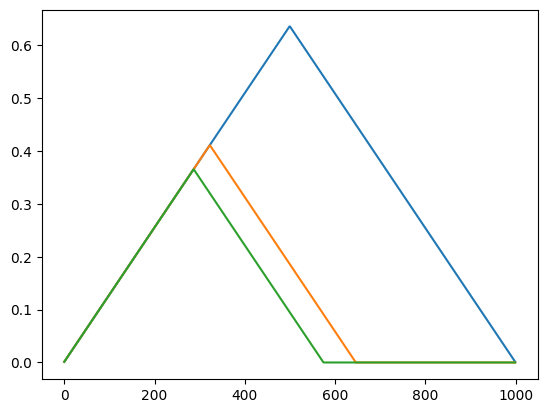

166


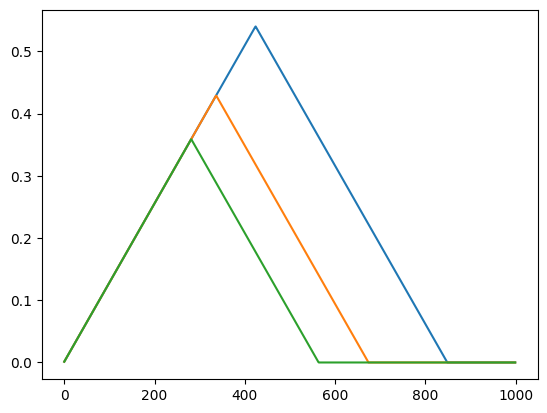

167


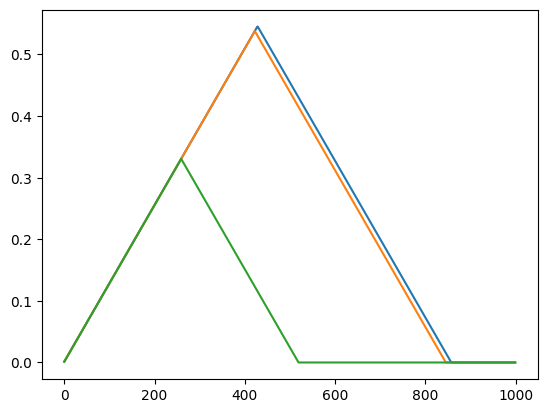

168


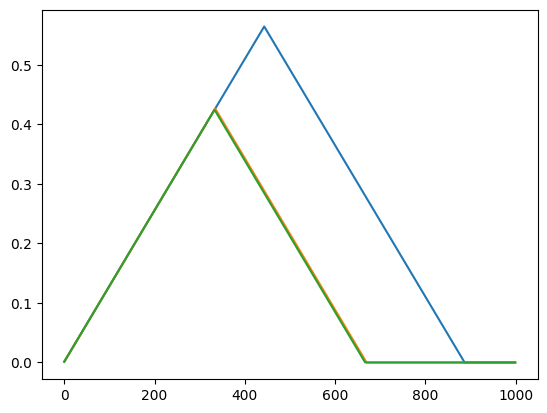

169


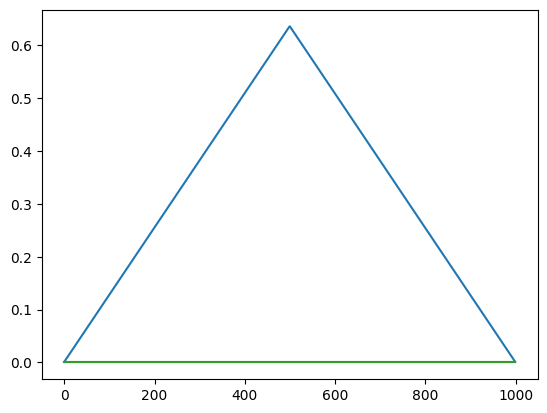

170


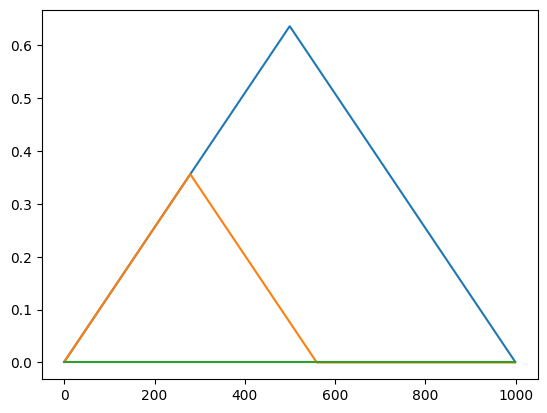

171


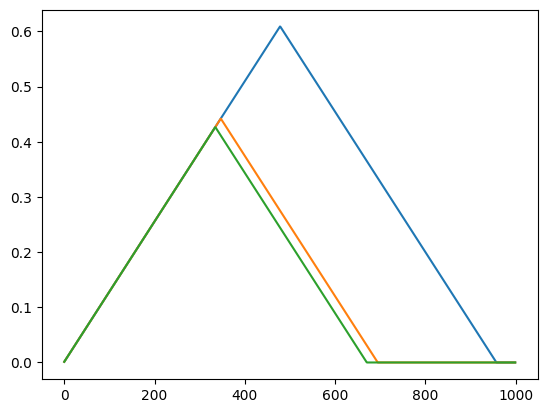

172


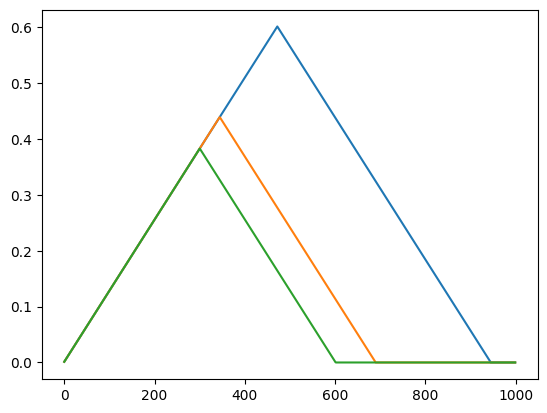

173


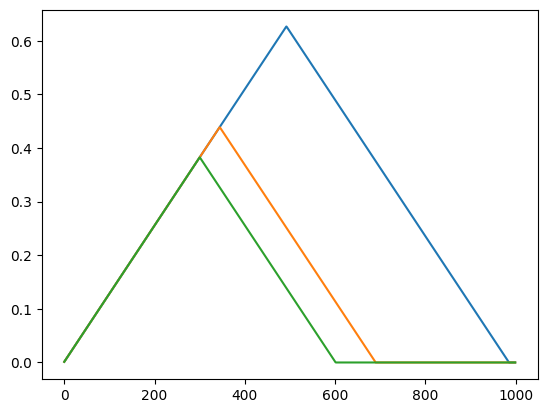

174


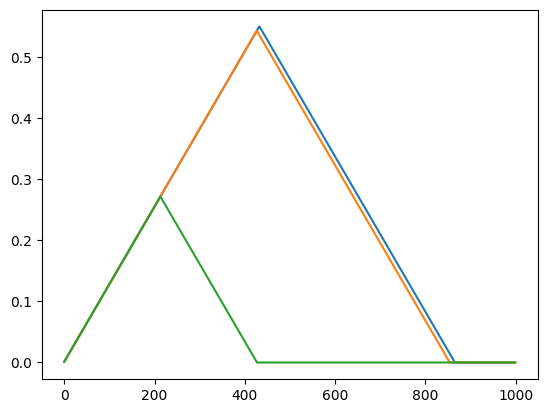

175


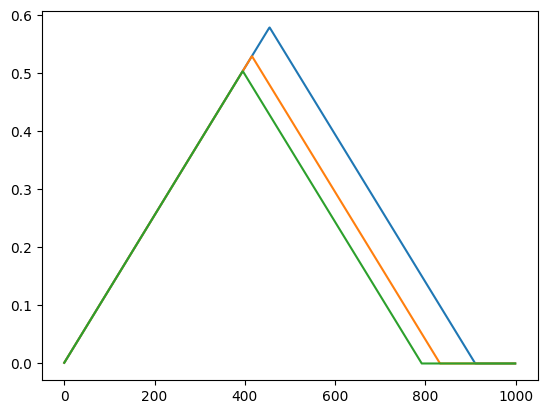

176


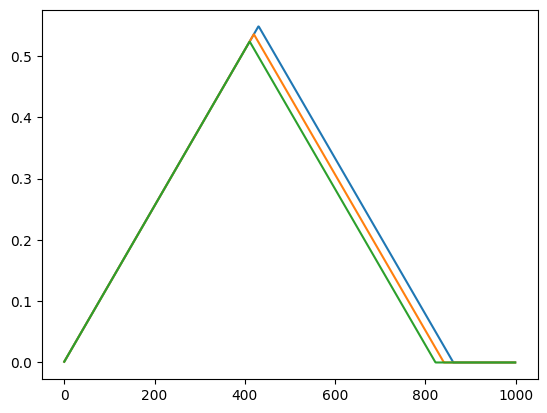

177


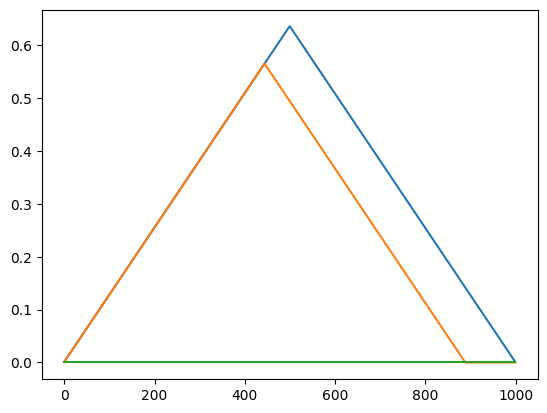

178


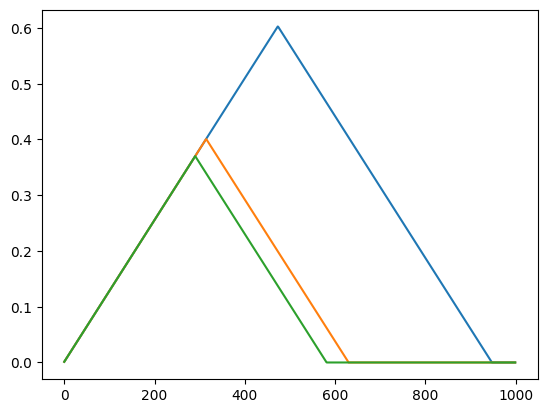

179


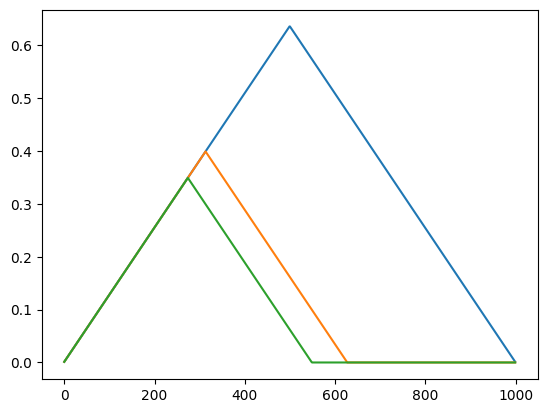

180


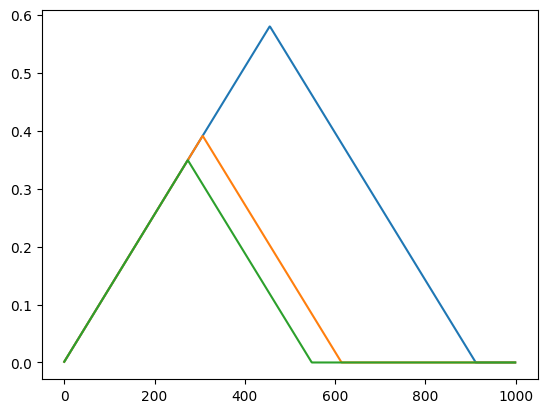

181


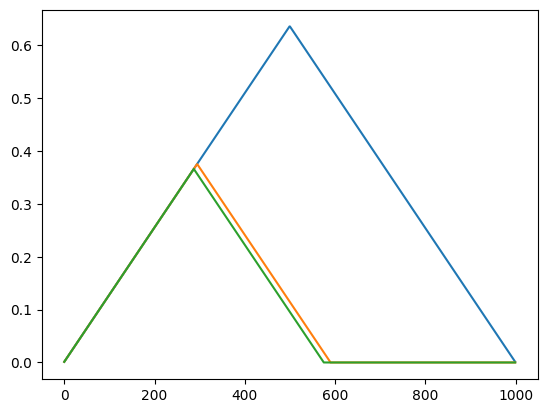

182


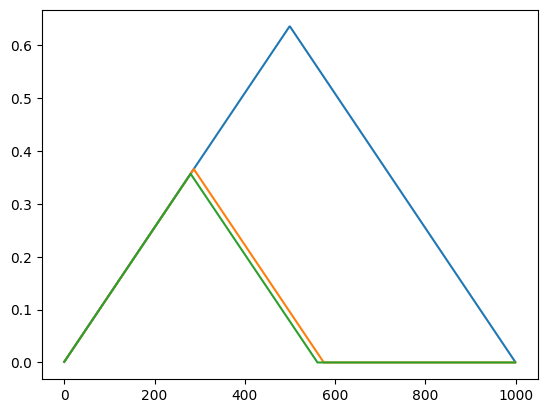

183


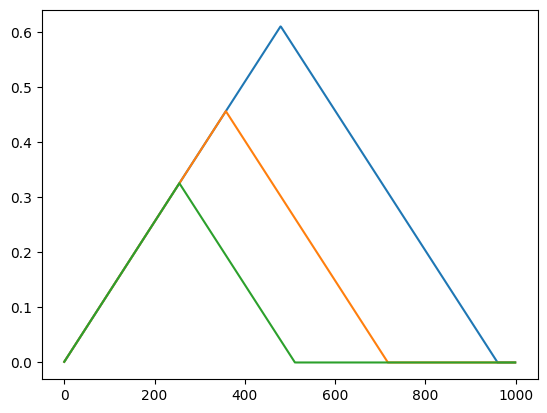

184


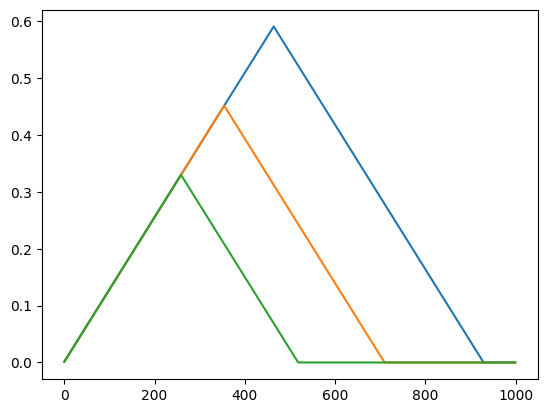

185


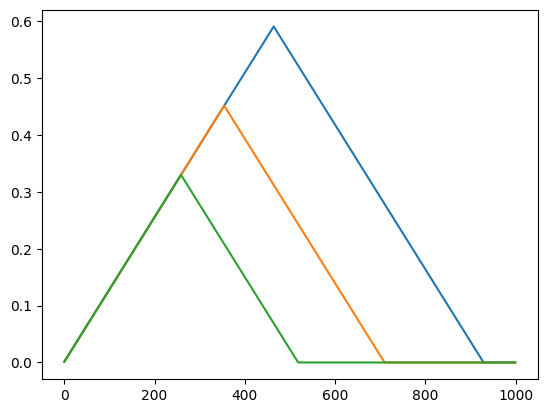

186


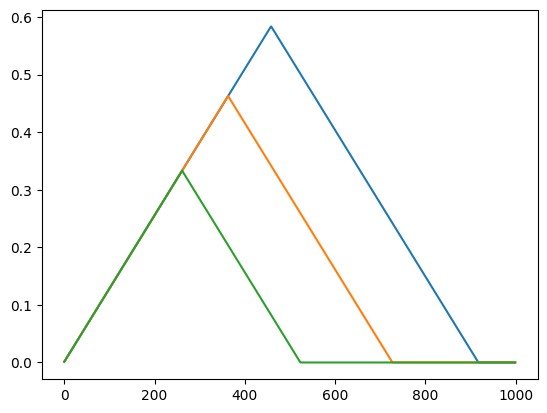

187


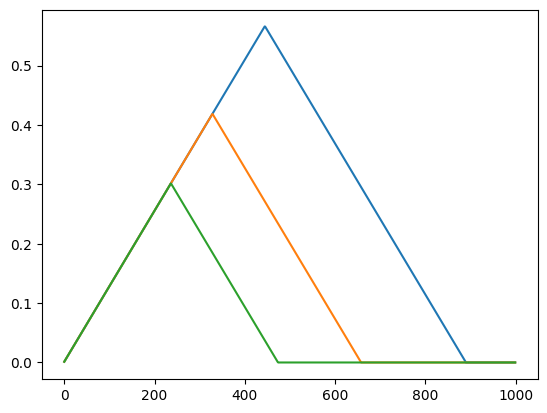

188


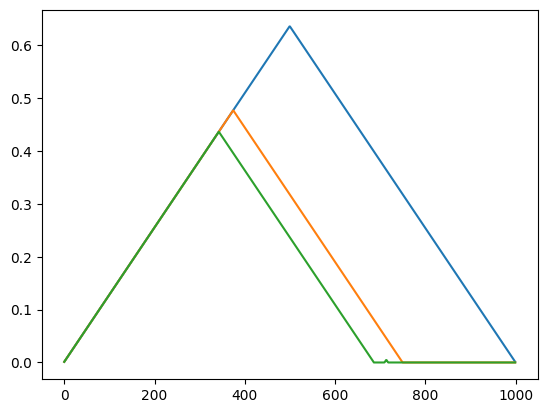

189


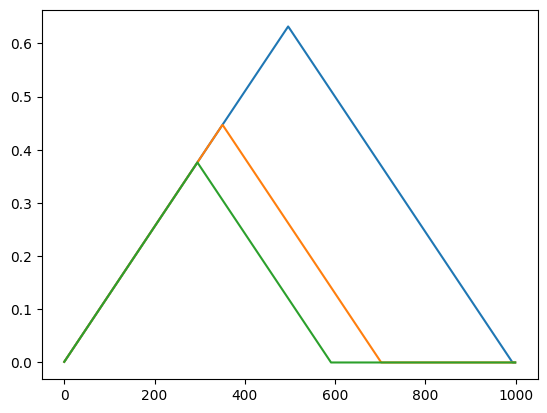

190


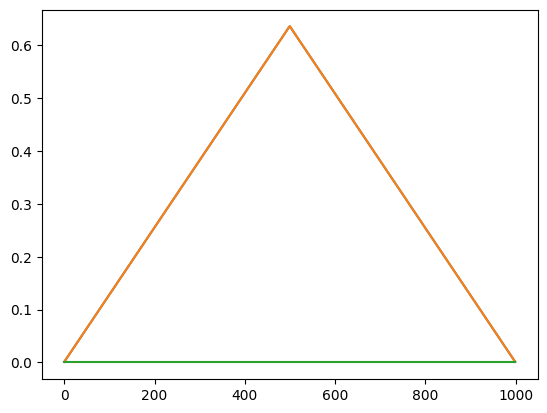

191


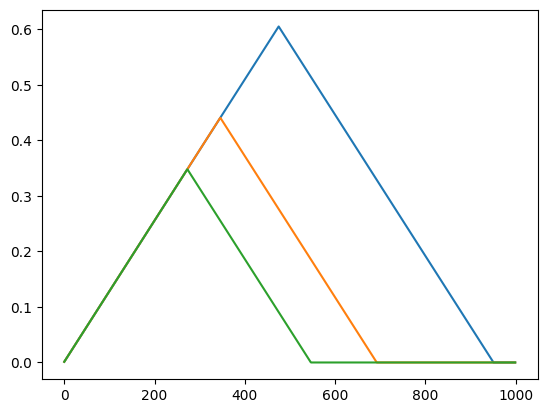

192


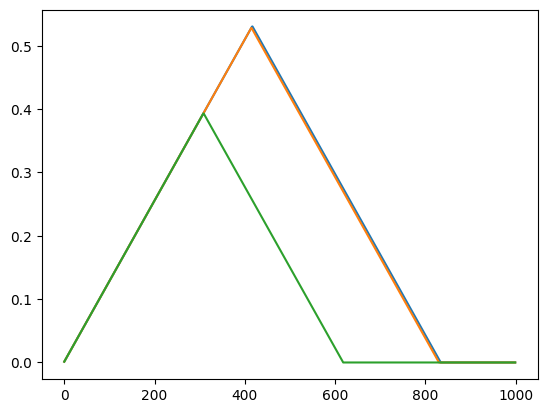

193


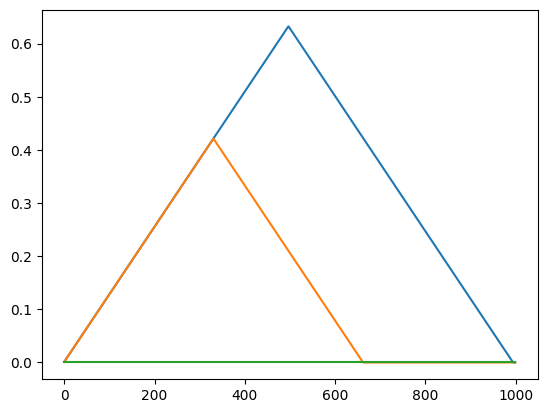

194


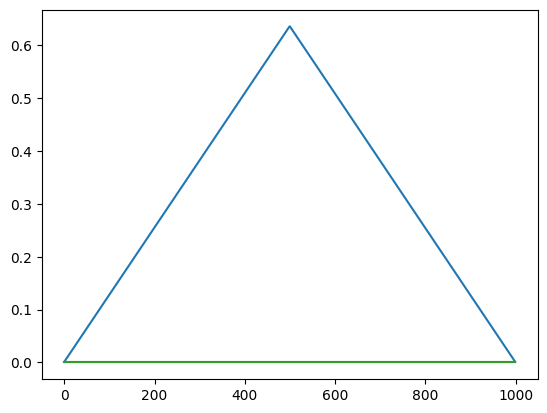

195


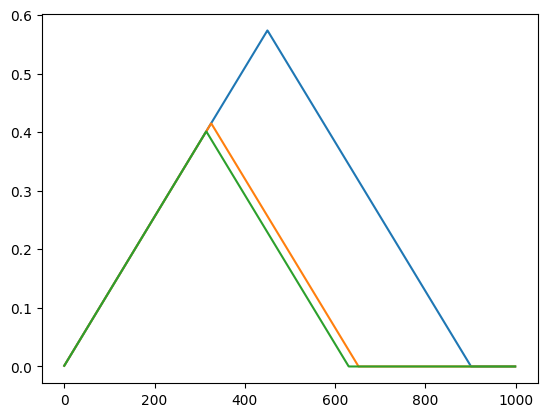

196


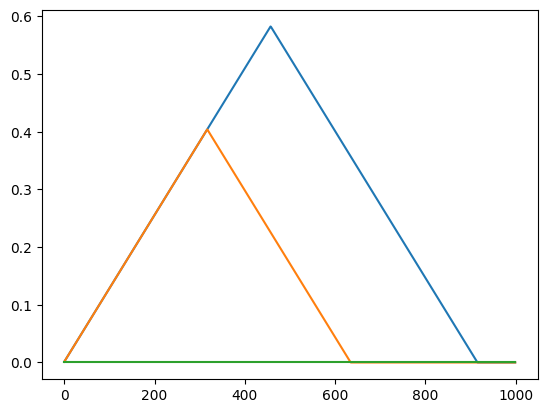

197


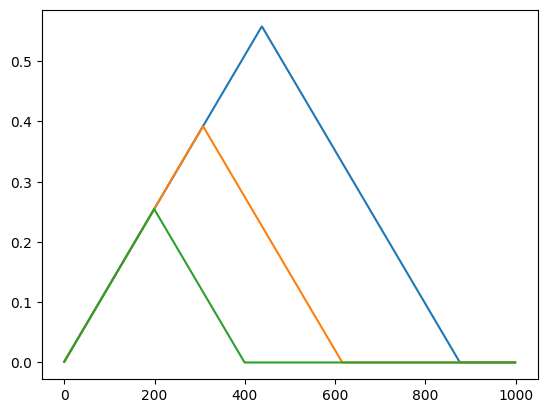

198


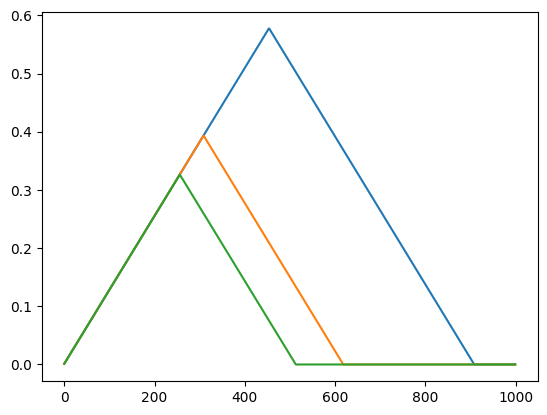

199


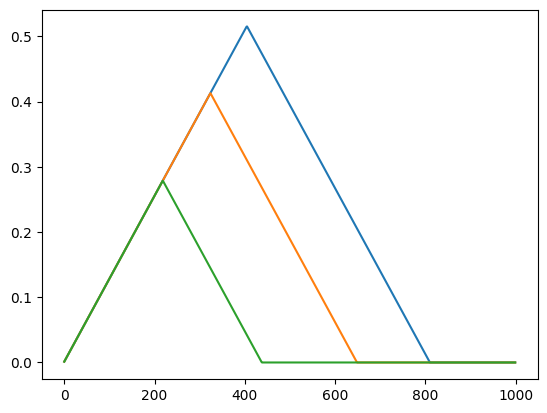

200


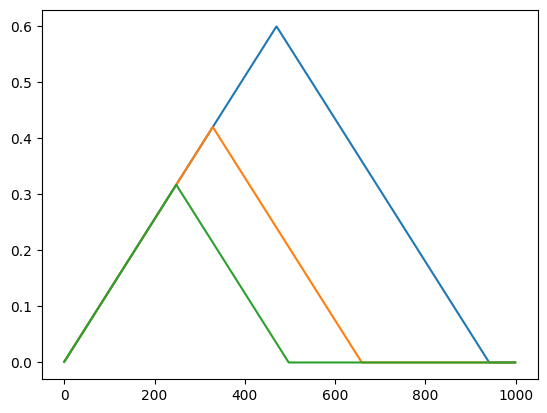

201


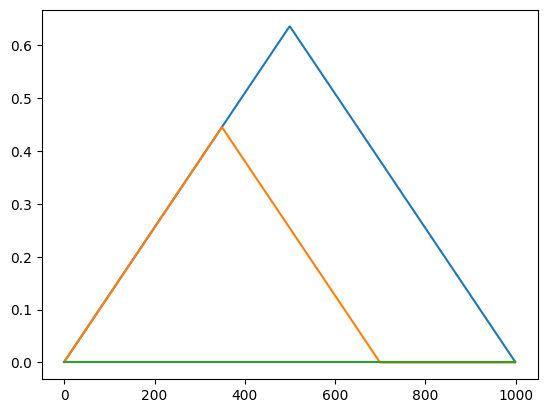

202


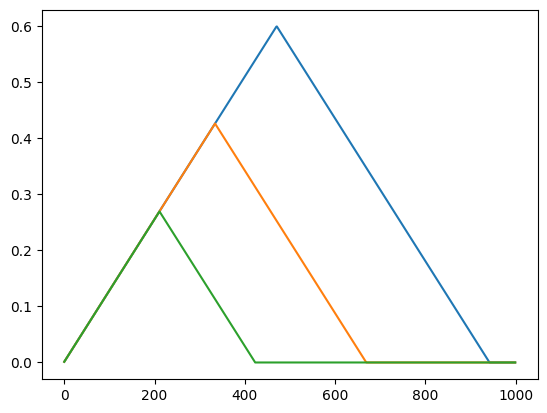

203


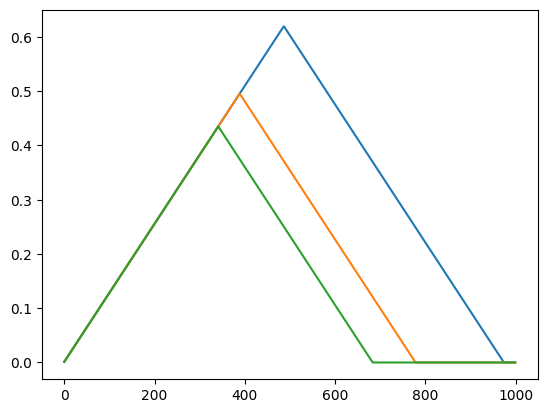

204


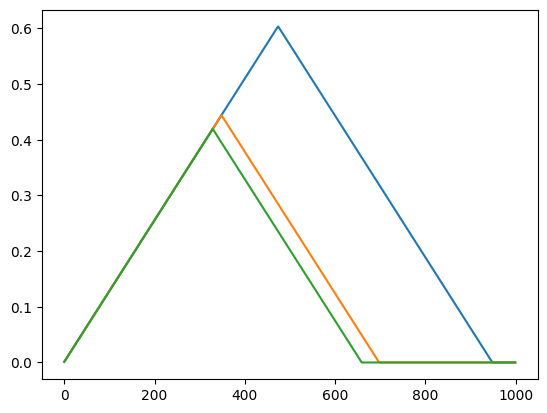

205


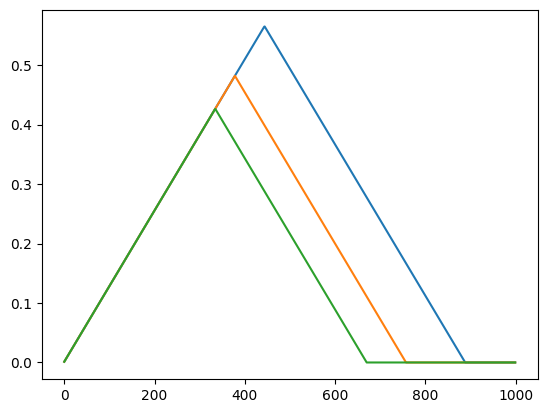

206


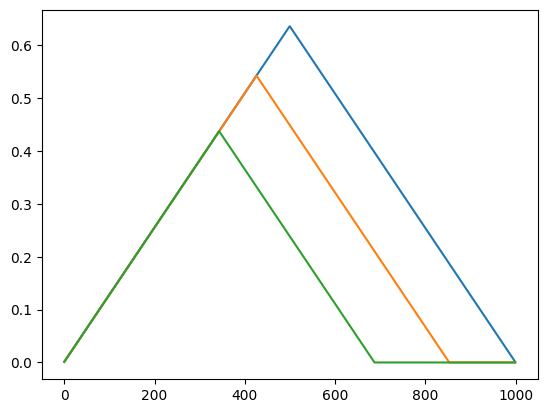

207


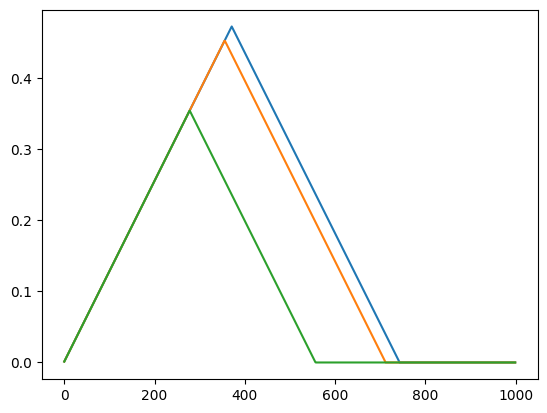

208


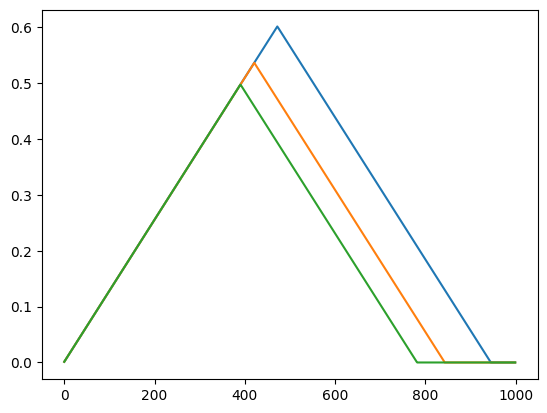

209


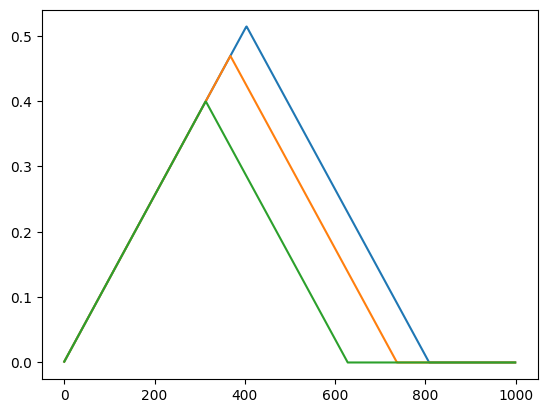

210


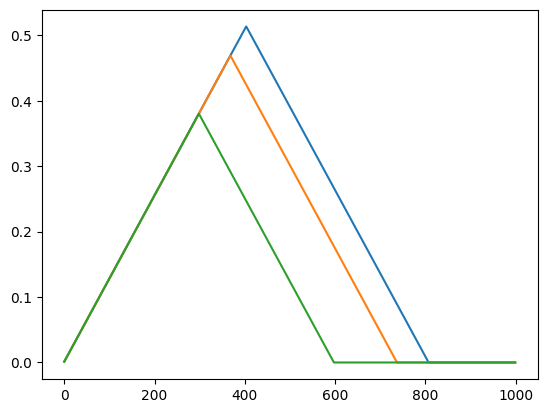

211


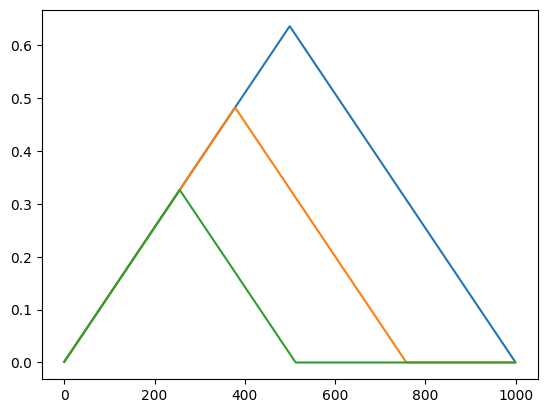

212


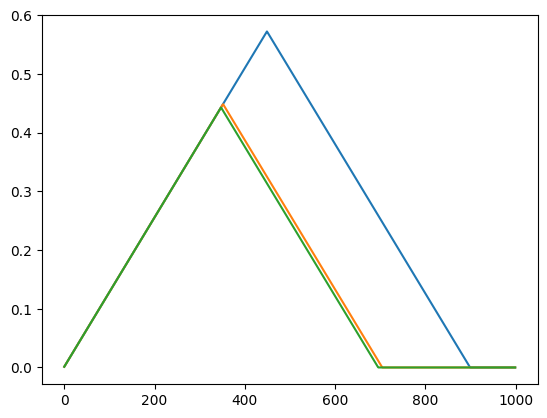

213


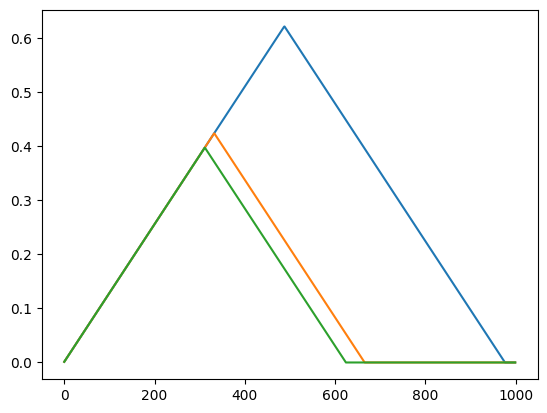

214


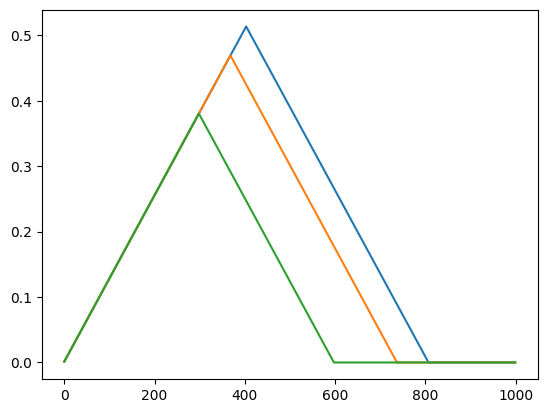

215


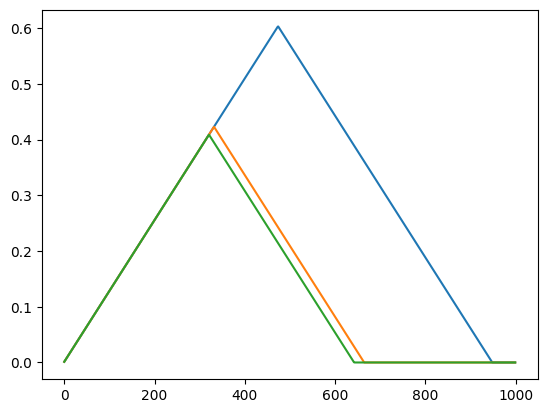

216


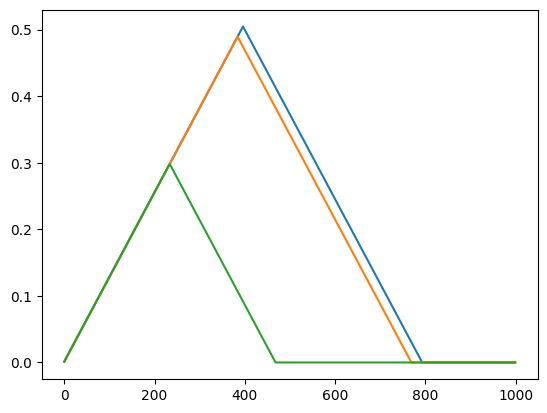

217


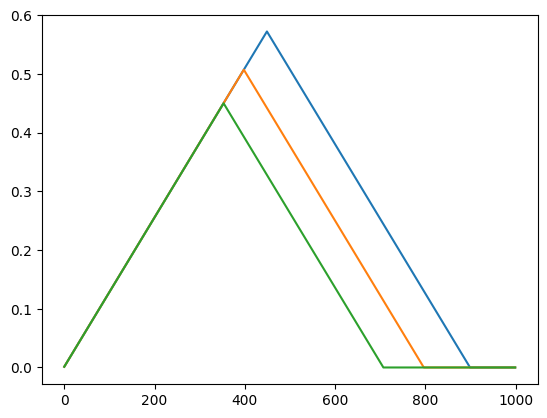

218


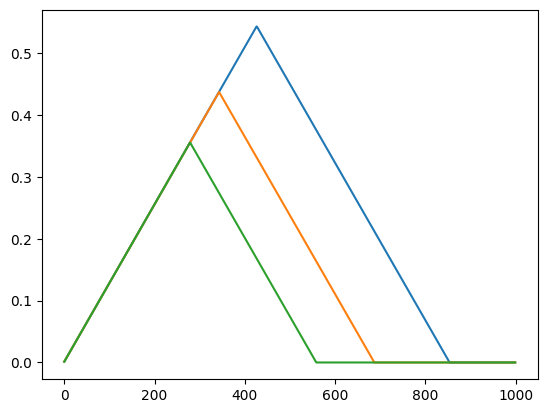

219


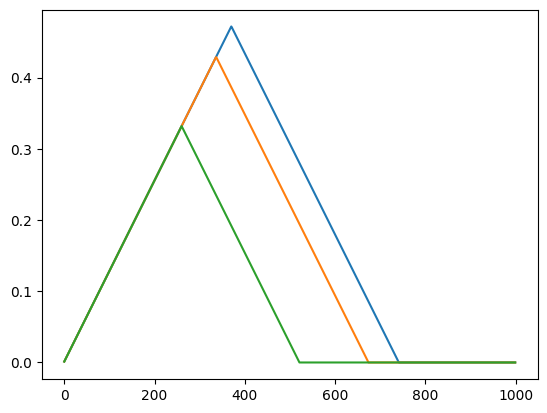

220


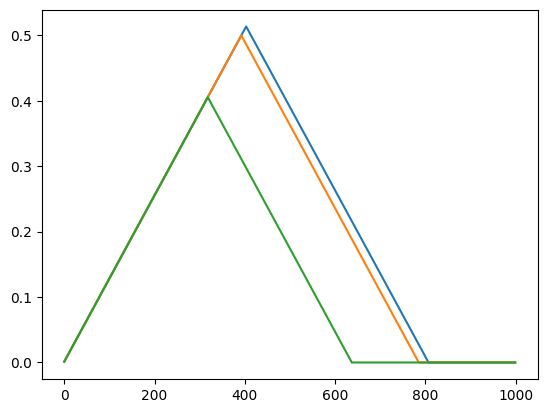

221


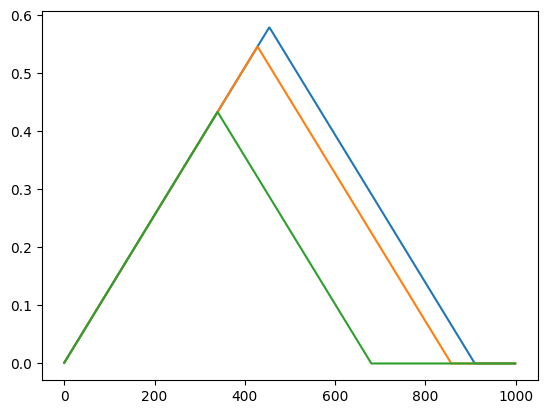

222


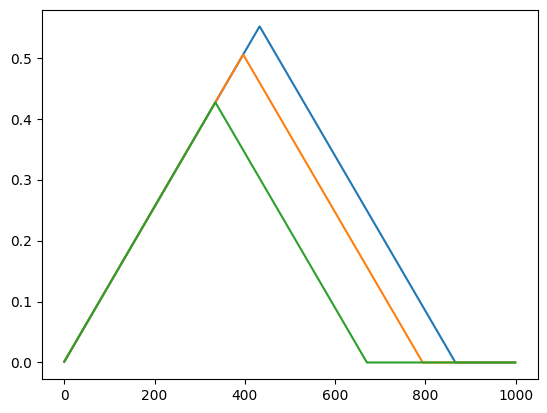

223


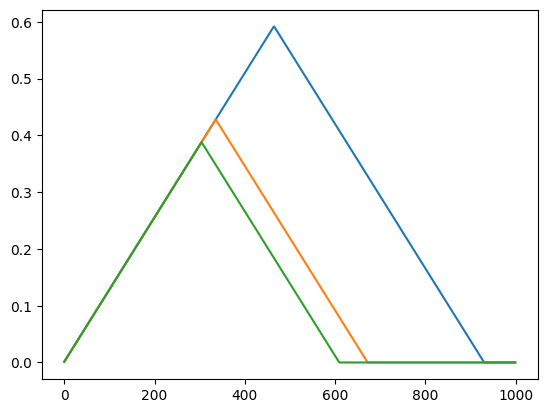

224


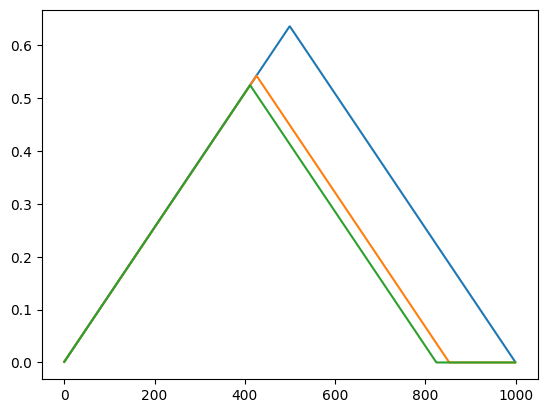

225


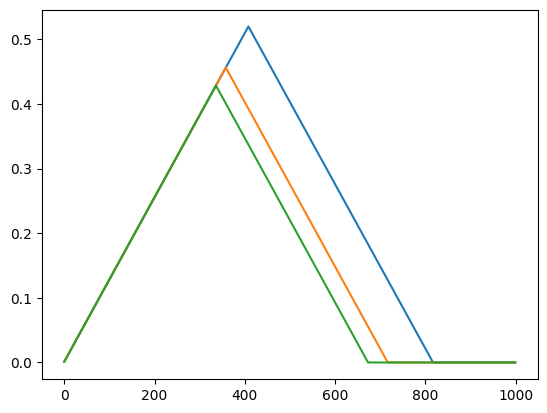

226


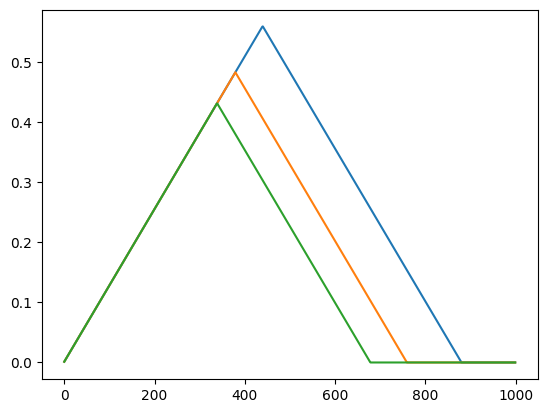

227


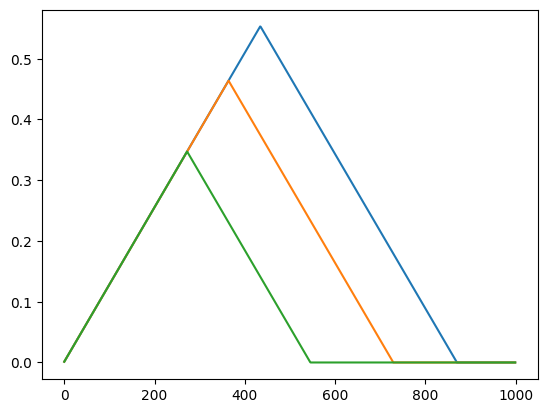

228


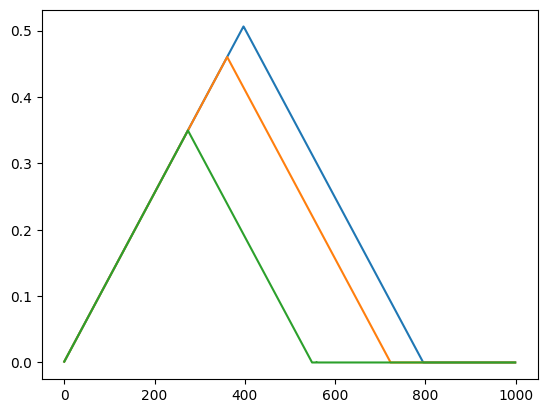

229


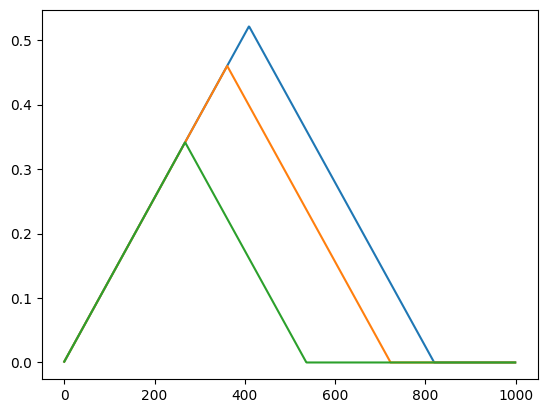

230


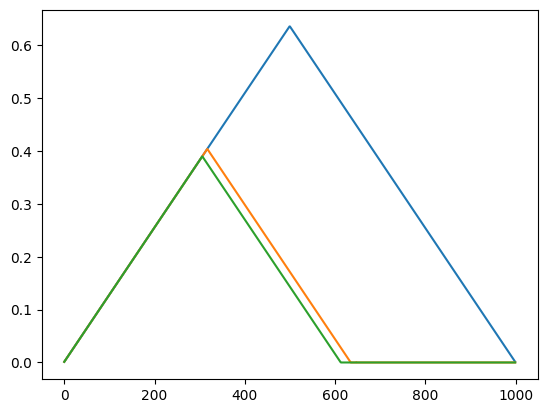

In [ ]:
Vectors = []  # List to store transformed persistence diagrams as feature vectors

# Iterate through each persistence diagram in diagram_points
for index,i in enumerate(diagram_points):
    print(index)
    D1 = np.array(i)  # Convert persistence diagram to NumPy array

    # Step 1: Select finite points from the persistence diagram
    proc1 = DiagramSelector(use=True, point_type="finite")

    # Step 2: Scale the birth and persistence values using MinMaxScaler
    proc2 = DiagramScaler(use=True, scalers=[([0, 1], MinMaxScaler())])

    # Step 3: Clamp persistence values to a maximum of 0.9
    proc3 = DiagramScaler(use=True, scalers=[([1], Clamping(maximum=0.9))])

    # Apply transformations sequentially: select points, scale, then clamp
    D1 = proc3(proc2(proc1(D1)))

    # Compute persistence landscape representation
    LS = Landscape(resolution=1000)
    L = LS(D1)

    # Store the computed landscape vector
    Vectors.append(L)

    # Plot the first three layers of the landscape
    plt.plot(L[:1000])  # First layer
    plt.plot(L[1000:2000])  # Second layer
    plt.plot(L[2000:3000])  # Third layer
    plt.show()  # Display the plot


In [ ]:
Tda_features = np.array(Vectors)  # Convert the list of persistence landscape vectors into a NumPy array

np.set_printoptions(suppress=True)  # Suppress scientific notation for better readability

# Convert list of vectors into a numpy array
tda_X = np.array(Tda_features)

# Apply PCA to reduce dimensionality of TDA features
pca = PCA(n_components=50)  # Choose the number of components based on explained variance
tda_X_pca = pca.fit_transform(tda_X)  # Fit and transform the TDA features using PCA

print("TDA Features Shape after PCA:", tda_X_pca.shape)

# Standardize each feature set independently
scaler_X = StandardScaler()  # Standard scaler for sentence embeddings
scaler_TDA = StandardScaler()  # Standard scaler for TDA-based features

X_scaled = scaler_X.fit_transform(X)  # Standardize the sentence embeddings
TDA_scaled = scaler_TDA.fit_transform(tda_X_pca)  # Standardize the PCA-transformed TDA features

# Concatenate the standardized sentence embeddings and TDA features along the feature axis
X_combined = np.hstack((X_scaled, TDA_scaled))  # Horizontally stack the two feature matrices


TDA Features Shape after PCA: (231, 50)


In [ ]:

# Defining a sequential neural network model
model = Sequential([
    Input(shape=(150,)),  # Input layer with shape 300 (concatenated feature size)

    Dense(128, activation="relu"),  # First dense layer with ReLU activation
    LayerNormalization(),  # Normalize activations to stabilize training
    Dropout(0.2),  # Dropout to prevent overfitting

    Dense(128, activation="relu"),  # Second dense layer with ReLU activation
    LayerNormalization(),  # Normalize activations
    Dropout(0.2),  # Dropout to prevent overfitting

    Dense(len(np.unique(Y)), activation="softmax"),  # Output layer with softmax activation for classification
])

# Compile the model with Adam optimizer and sparse categorical cross-entropy loss
model.compile(optimizer='adam', loss="sparse_categorical_crossentropy", metrics=['accuracy'])

# Print the model summary to check architecture
model.summary()

# Train the model
model_history = model.fit(
    x=X_combined,  # Training data (concatenated features)
    y=Y,  # Target labels
    batch_size=10,  # Batch size for training
    callbacks=[tensorflow.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)],  # Early stopping to prevent overfitting
    epochs=50  # Maximum number of training epochs
)


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 128)               19328     
                                                                 
 layer_normalization_14 (Lay  (None, 128)              256       
 erNormalization)                                                
                                                                 
 dropout_14 (Dropout)        (None, 128)               0         
                                                                 
 dense_22 (Dense)            (None, 128)               16512     
                                                                 
 layer_normalization_15 (Lay  (None, 128)              256       
 erNormalization)                                                
                                                                 
 dropout_15 (Dropout)        (None, 128)              

In [ ]:
def sentence_embedding(sentence, model, vector_size=100):
    # Split the sentence into individual words
    words = sentence.split()

    # Extract word embeddings for words present in the model's vocabulary
    embeddings = [model.wv[word] for word in words if word in model.wv]

    # If the sentence has only one word, append a zero vector to avoid single-point issues
    if len(embeddings) == 1:
        embeddings.append(np.zeros(vector_size))

      # Handle case where no embeddings were found for any words in the sentence
    if not embeddings:
        print("No embeddings found for:", sentence)
        fasttext_vector = fasttext_model.wv[sentence]
        embeddings = [fasttext_model.wv[word] for word in words if word in fasttext_model.wv]

    # Apply Topological Data Analysis (TDA) using GUDHI
    rips = gudhi.RipsComplex(points=embeddings, max_edge_length=100)  # Construct Rips Complex
    simplex_tree = rips.create_simplex_tree(max_dimension=5)  # Build a simplex tree with max dimension 5
    diag = simplex_tree.persistence(homology_coeff_field=2, min_persistence=-1)  # Compute persistence diagram

    # Extract persistence diagram points
    diagram_point = [point[1] for point in diag]

    # Return persistence diagram and mean embedding vector
    return diagram_point, np.mean(embeddings, axis=0)


In [ ]:
def generate_answer(pattern):
    # Get Word2Vec embedding
    diag, mean_embedding = sentence_embedding(pattern, fasttext_model, vector_size=100)

    if mean_embedding is None or np.all(mean_embedding == 0):
        print("No embeddings found for:", pattern)
        return

    # Reshape embedding for consistency
    mean_embedding = mean_embedding.reshape(1, -1)

    # Apply TDA processing
    D1 = np.array(diag)
    D1 = DiagramScaler(use=True, scalers=[([1], Clamping(maximum=.9))])(
        DiagramScaler(use=True, scalers=[([0,1], MinMaxScaler())])(
            DiagramSelector(use=True, point_type="finite")(D1)
        )
    )

    # Transform TDA features
    tda_feature = Landscape(resolution=1000)(D1).reshape(1, -1)
    tda_feature_pca = pca.transform(tda_feature)

    # Standardize embeddings and TDA features
    x_test_combined = np.hstack((
        scaler_X.transform(mean_embedding),
        scaler_TDA.transform(tda_feature_pca)
    ))

    # Predict response
    y_pred = model.predict(x_test_combined).argmax()
    tag = lbl_enc.inverse_transform([y_pred])[0]
    responses = df[df['tag'] == tag]['responses'].values[0]

    print(f"model: {random.choice(responses)}")


In [ ]:
generate_answer("can you give me motivation, I am very depressed")

1/1 [==============================] - 0s 153ms/step
model: Let's discuss further why you're feeling this way.


In [ ]:
def chat():
    while True:
        pattern = input("You: ")  # Get user input
        if pattern.lower() == "exit":
            print("model: Goodbye! Take care. 😊")
            break  # Exit loop if user types "exit"

        generate_answer(pattern)  # Call your function to generate response

# Start the chatbot
chat()


You: Hey
1/1 [==============================] - 0s 31ms/step
model: Hi there. What brings you here today?
You: i not able to eat properly recently so do i need to consult a therapist?
1/1 [==============================] - 0s 40ms/step
model: It'll all be okay. This feeling is only momentary.
You: okay then fine
1/1 [==============================] - 0s 36ms/step
model: I'm Pandora, a Therapeutic AI Assitant designed to assist you. Tell me about yourself.
You: i am nithisha 
1/1 [==============================] - 0s 34ms/step
model: For a diagnosis of depression, a person needs to have experienced low mood or loss of interest or pleasure in life for at least 2 weeks. Also, they will have experienced the following symptoms: feelings of sadness, hopelessness, or irritability nearly every day.
You: oh i have low mood sometimes
1/1 [==============================] - 0s 34ms/step
model: I'm very sorry to hear that but you have so much to look forward to. Please seek help by contacting: 9152